Copy right: <br>
Under GNU 3.0 License:

Zesheng Jia

Download the dataset from this website:

https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri

In [ ]:
## Add your own dataset dir here

dataset_dir ="F:/academic/2022/DIffusion/Diffusion_project/dataset"

# Import libraries

In [ ]:
# !pip uninstall matplotlib
# !pip install matplotlib==3.1.3

In [ ]:
!pip install -q -U einops datasets tqdm
import math
from inspect import isfunction
from functools import partial

%matplotlib inline
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange

import torch
from torch import nn, einsum
import torch.nn.functional as F

# Define buliding blocks

### Fundamental Functions

First we define the fundamental functions like residual connection and upsample and downsample method for future using in other functions.

In [ ]:
# function check the item if it exists
def exists(x):
    return x is not None

# if the value exits then return the values
def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

# add residual connection
# simply return itself addition with future calculation
class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

# Applies a 2D transposed convolution operator over an input image composed of several input planes'
# kernel size with 4 x 4
# stride size with 2
# padding size with 1
def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

# Applies a simple convolution operator
def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)


### Position embeddings

The position of each step in the forward pass and backward pass is important for the model to know when and where to stop. This makes the neural network "understand" at which particular time step (noise level) it is operating, for every image in a batch. 
And in this procedure, we use the position embeddings from the Transformers, [(Vaswani et al., 2017)](https://arxiv.org/abs/1706.03762).



Instead of using a naive integer index, people found that if we combine sin(x) and cos(x). It would work perfectly in showing the order of sequences.

$$
p_i = \begin{bmatrix}
           sin(i/10000^{2 \cdot \frac{1}{d}}) \\
           cos(i/10000^{2 \cdot \frac{1}{d}})  \\
           sin(i/10000^{2 \cdot \frac{2}{d}}) \\
           cos(i/10000^{2 \cdot \frac{2}{d}})  \\
           \vdots \\
           sin(i/10000^{2 \cdot \frac{i}{d}}) \\
           cos(i/10000^{2 \cdot \frac{i}{d}})  \\
        \vdots \\
           sin(i/10000^{2 \cdot \frac{d}{d}}) \\
           cos(i/10000^{2 \cdot \frac{d}{d}})  \\
         \end{bmatrix}
$$

> Picture of Position encoding


In [ ]:
# Add position Embeddings
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        # get the current device
        device = time.device
        # we only need half of current dimensions
        half_dim = self.dim // 2

        # Equation of calculating the position embeddings
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


### ResNet/ConvNeXT block

And in the next step, we use Unet for down sampling the input images from pure RGB values to the segmentation maps. But for recoginzing the images values, we use two fundamental CNN block as ResNet and ConvNext block.

In [ ]:
class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        # Add first layer of 2D Conv
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        # Add group Attention
        self.norm = nn.GroupNorm(groups, dim_out)
        # Sigmoid activation function
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x


# Add Resnet Block
# The activation function we choose is sigmoid function
# Applies the Sigmoid Linear Unit (SiLU) function

class ResnetBlock(nn.Module):
    """https://arxiv.org/abs/1512.03385"""

    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out))
            if exists(time_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.block1(x)

        # here we use einops package for re-arrange dimensions
        # einops.rearrange is a reader-friendly smart element reordering for multidimensional tensors.
        # This operation includes functionality of transpose (axes permutation), reshape (view),
        # squeeze, unsqueeze, stack, concatenate and other operations.

        if exists(self.mlp) and exists(time_emb):
            # we add 1 multi-layer perceptron
            time_emb = self.mlp(time_emb)
            # we add 2 extra dimensions from batch and channel to
            # 4 dimension tensor (batch, channel, 1, 1 )
            h = rearrange(time_emb, "b c -> b c 1 1") + h

        h = self.block2(h)
        return h + self.res_conv(x)


# There is one extra model we defined. That is ConvNext model
# GELU for Gaussian Error Linear Units function:

class ConvNextBlock(nn.Module):
    """https://arxiv.org/abs/2201.03545"""

    def __init__(self, dim, dim_out, *, time_emb_dim=None, mult=2, norm=True):
        super().__init__()
        self.mlp = (
            # We use Gaussian Error Linear Units function:
            nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, dim))
            if exists(time_emb_dim)
            else None
        )

        self.ds_conv = nn.Conv2d(dim, dim, 7, padding=3, groups=dim)

        self.net = nn.Sequential(
            nn.GroupNorm(1, dim) if norm else nn.Identity(),
            nn.Conv2d(dim, dim_out * mult, 3, padding=1),
            nn.GELU(),
            nn.GroupNorm(1, dim_out * mult),
            nn.Conv2d(dim_out * mult, dim_out, 3, padding=1),
        )

        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.ds_conv(x)

        if exists(self.mlp) and exists(time_emb):
            assert exists(time_emb), "time embedding must be passed in"
            condition = self.mlp(time_emb)
            h = h + rearrange(condition, "b c -> b c 1 1")

        h = self.net(h)
        return h + self.res_conv(x)

### Attention module

By the popular and sucess of Transformers bring us, we also add attention module in our model. For retriving the most important features from all images feature maps. 


In [ ]:
class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()

        # Get attention heads and dimensions
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads

        # separate one parameter matrix to 3 matrix as query, key, and value
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        # output dimension (Hidden_dim, dim, 1)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):

        # b for batch size
        # c for channel
        # h for height
        # w for weight
        b, c, h, w = x.shape

        # concatenate q,k,v together
        qkv = self.to_qkv(x).chunk(3, dim=1)

        # rearrange qkv's dimension
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        # calculating the attention score:

        q = q * self.scale

        sim = einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)

        out = einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)


        return self.to_out(out)


class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        # linear Attention imporving
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        # add convolutional layer
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        # output
        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1),
                                    nn.GroupNorm(1, dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        # change the dimensions
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        # calculate attention
        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)

        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)

### Group normalization

We also apply the group normalizatoin before the attention layer.

In [ ]:
# Perform Group Normalization
class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

### Conditional U-Net

Now we define the entire model step by step.

1. Add one convolutional layer on the batch of images that are added noise and postional embeddings on each step during the markov chain.
2. And we use 2 ResNet/ConvNext blocks with group norm + attention layer + residual connection + downsample operation for downsampling the origianl image RGB inputs.
3. Then we use ResNet or ConvNext blocks with attention again for further downsampling. 
4. After we get into the lowest dimension of our downsampling stage, we appling upsampling by the same combination of blocks, such that CNN blocks + group norm + attention and residual connection. All those steps are for upsampling the features we got before.
5. At the end, we apply one ResNet + convolutional layer for getting the output segmentation map.

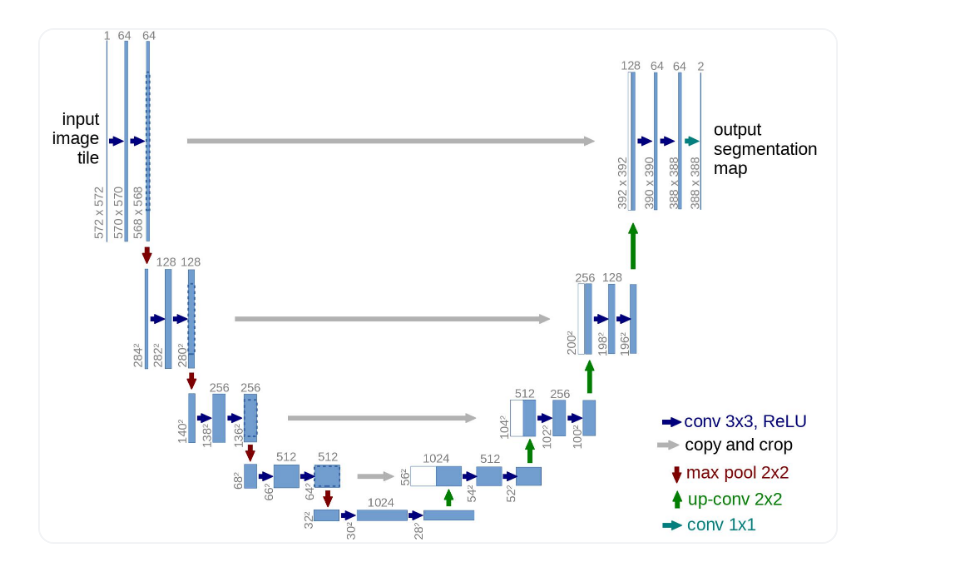

In [ ]:
class Unet(nn.Module):
    def __init__(
        self,
        dim,
        init_dim=None,
        out_dim=None,
        dim_mults=(1, 2, 4, 8),
        channels=3,
        with_time_emb=True,
        resnet_block_groups=8,
        use_convnext=True,
        convnext_mult=2,
    ):
        super().__init__()

        # determine dimensions
        self.channels = channels

        init_dim = default(init_dim, dim // 3 * 2)
        # init convolutional layer
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        # decided if we want to use ConvNext model
        
        if use_convnext:
            block_klass = partial(ConvNextBlock, mult=convnext_mult)
        else:
            block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings
        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
        else:
            time_dim = None
            self.time_mlp = None

        # layers
        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        # implementation of UNeT
        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_out, time_emb_dim=time_dim),
                        block_klass(dim_out, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Downsample(dim_out) if not is_last else nn.Identity(),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(dim_out * 2, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Upsample(dim_in) if not is_last else nn.Identity(),
                    ]
                )
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            block_klass(dim, dim), nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time):
        x = self.init_conv(x)

        t = self.time_mlp(time) if exists(self.time_mlp) else None

        h = []

        # downsample
        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        # bottleneck
        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        # upsample
        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        return self.final_conv(x)

## Forward diffusion process

Here, we introduce the timesteps. From the original paper, it is the number of denosing or add nosing steps of one simple forward or backward diffusion procedure. The more timesteps it has in one step, the more clearly the image could be. In the original paper, they use 2000 timesteps for one pass. 

And the following is the 4 kinds of variance schedule for how to add noises. 


In [ ]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

In our case, we use 300 timesteps during the training. Since more timesteps bring us more training time. And train a image model takes too long to finish. We start from small number.


In [ ]:
timesteps = 300

# define beta schedule
betas = linear_beta_schedule(timesteps=timesteps)

# define alphas 
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)

# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

Now we show a complete process of how do we add noise in the MRI image.

In [ ]:
from PIL import Image
import requests

url = 'https://upload.wikimedia.org/wikipedia/commons/b/b2/MRI_of_Human_Brain.jpg'
image = Image.open(requests.get(url, stream=True).raw)

<img src="https://upload.wikimedia.org/wikipedia/commons/b/b2/MRI_of_Human_Brain.jpg" width="400" />




This is a demo image we would like to process.

But first, we resize the image to 128 * 128 pixels for a better speed. And we use center crop to get the center image. Without doing so, we could end up with some weird wrong dimension errors that are caused by Pytorch.
We also use Lambda function to normalize the RGB values to 0 and 1.

Then we add one dension for the batch size 1.

In [ ]:
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize

image_size = 128
transform = Compose([
    Resize(image_size),
    CenterCrop(image_size),
    ToTensor(), # turn into Numpy array of shape HWC, divide by 255
    Lambda(lambda t: (t * 2) - 1),
    
])

x_start = transform(image).unsqueeze(0)
x_start.shape

torch.Size([1, 3, 128, 128])



We also define the reverse transform, which takes in a PyTorch tensor containing values in $[-1, 1]$ and turn them back into a PIL image:

In [ ]:
import numpy as np

reverse_transform = Compose([
     Lambda(lambda t: (t + 1) / 2),
     Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
     Lambda(lambda t: t * 255.),
     Lambda(lambda t: t.numpy().astype(np.uint8)),
     ToPILImage(),
])

Let's verify this:

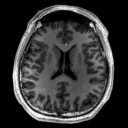

In [ ]:
reverse_transform(x_start.squeeze())

We can see from the numerical value, now we have the original picture with 128 * 128 resolution.


We can now define the forward diffusion process as in the paper:


In [ ]:
# forward diffusion
def q_sample(x_start, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    )

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

Let's test it on a particular time step:

In [ ]:
def get_noisy_image(x_start, t):
  # add noise
  x_noisy = q_sample(x_start, t=t)

  # turn back into PIL image
  noisy_image = reverse_transform(x_noisy.squeeze())

  return noisy_image

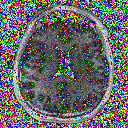

In [ ]:
# take time step
t = torch.tensor([40])

get_noisy_image(x_start, t)

Let's visualize this for various time steps:

In [ ]:
import matplotlib.pyplot as plt

# use seed for reproducability
torch.manual_seed(0)

# source: https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py
def plot(imgs, with_orig=False, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(figsize=(200,200), nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [image] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

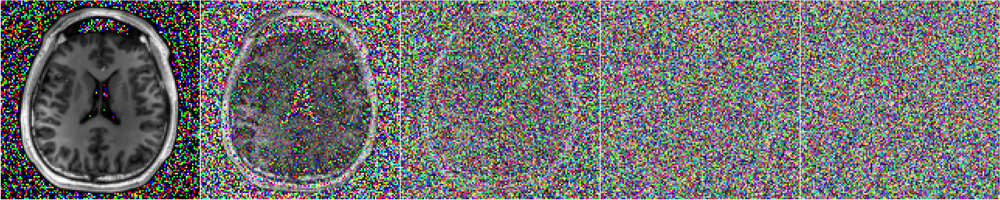

In [ ]:
plot([get_noisy_image(x_start, torch.tensor([t])) for t in [0, 50, 100, 150, 199]])

This means that we can now define the loss function given the model as follows:

In [ ]:
def p_losses(denoise_model, x_start, t, noise=None, loss_type="l1"):
    if noise is None:
        noise = torch.randn_like(x_start)

    x_noisy = q_sample(x_start=x_start, t=t, noise=noise)
    predicted_noise = denoise_model(x_noisy, t)

    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

The `denoise_model` will be our U-Net defined above. We'll employ the Huber loss between the true and the predicted noise.

## Define a PyTorch Dataset + DataLoader

We use the kaggle [MRI dataset](https://www.kaggle.com/datasets/sartajbhuvaji/brain-tumor-classification-mri)

Each image is resized to the same size.


In [ ]:
# !unzip /content/drive/MyDrive/4155/archive.zip -d dataset

In [ ]:
from datasets import load_dataset
dataset = load_dataset("imagefolder", data_dir = dataset_dir)
# dataset = load_dataset("fashion_mnist")

Resolving data files:   0%|          | 0/3264 [00:00<?, ?it/s]

Using custom data configuration default-5501923bb35f5511
Found cached dataset imagefolder (C:/Users/zesheng_jia/.cache/huggingface/datasets/imagefolder/default-5501923bb35f5511/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f)


  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 3264
    })
})

Then we set up our hyperparameters.

1. We resize the image to 44 * 44 pixels. Since after applying many different combinations, 44 by 44 is the only value we can successfully train our model.
2. Batch size == 80. Any batch size smaller than 80 will cause our model fail to improve after 200 epochs.
3. Channels == 1 for black and white only, images.

Next, we do image transformations. 

1. Resize the image to 44.
2. CenterCrop to avoid any unregular resolution images.
3. RandomHorizontalFlip for more data variations.
4. ToTensor and use Lambda to normalize the input values to 0 and 1.

At the end, we convert all images to a pytorch data loader.

### Hyperparameters

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader

image_size = 44
channels = 1
batch_size = 80


# define image transformations (e.g. using torchvision)
transform = Compose([
            Resize(image_size),
            CenterCrop(image_size),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Lambda(lambda t: (t * 2) - 1)
])

# define function
def transforms(examples):
    # save images to a new array and convert to greyscale by "convert("l")"
   examples["pixel_values"] = [transform(image.convert("L")) for image in examples["image"]]
   del examples["image"]

   return examples

transformed_dataset = dataset.with_transform(transforms).remove_columns("label")

# create dataloader
dataloader = DataLoader(transformed_dataset["train"], batch_size=batch_size, shuffle=True)

In [ ]:
batch = next(iter(dataloader))
print(batch.keys())

dict_keys(['pixel_values'])


## Sampling


<img src="https://drive.google.com/uc?id=1ij80f8TNBDzpKtqHjk_sh8o5aby3lmD7" width="500" />


We use the same sampling method from the original paper for generating our images by number of Timesteps. We start from time $T$ and we sample pure Gaussian noise values, then we use our UNet model to gradually denoise it, until the timesteps we set up before, which is 300. 

In the best case, we will get a new and orignal MRI scan from the random Gaussian nosie as the model generate a brain scan for us.

In [ ]:
@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)
    
    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

# Algorithm 2 but save all images:
@torch.no_grad()
def p_sample_loop(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)
    imgs = []
    
    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        img = p_sample(model, img, torch.full((b,), i, device=device, dtype=torch.long), i)
        imgs.append(img.cpu().numpy())
    return imgs

@torch.no_grad()
def sample(model, image_size, batch_size=16, channels=3):
    return p_sample_loop(model, shape=(batch_size, channels, image_size, image_size))



## Train the model

We train this model with a standard pytorch trainer.

In [ ]:
## clean cache in the GPU memory

with torch.no_grad():
    torch.cuda.empty_cache()

### Define our model and put it into GPU.
And we use Adam optimizer here.

In [ ]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"

model = Unet(
    dim=image_size,
    channels=channels,
    dim_mults=(1, 2, 4,)
)
model.to(device)

optimizer = Adam(model.parameters(), lr=1e-3)

### First time training:

In [ ]:
from torchvision.utils import save_image
# For plotting learning curve
from torch.utils.tensorboard import SummaryWriter


# Hyperparameters

epochs = 1200
patience = 100 # If no improvement in 'patience' epochs, early stop

# Initialize trackers, these are not parameters and should not be changed
stale = 0
best_loss = 100000
_exp_name = "models"
loss_step = 0
best_epoch = 0

writer = SummaryWriter() # Writer of tensoboard.


for epoch in tqdm(range(epochs)):
  # save batch loss
  batch_loss = 100000
  total_batch_loss = 0
  local_steps = 0

  print("Epoch  == ", epoch)
  for step, batch in tqdm(enumerate(dataloader), total = 41):

    local_steps += 1

    optimizer.zero_grad()

    batch_size = batch["pixel_values"].shape[0]
    batch = batch["pixel_values"].to(device)

    # Algorithm 1 line 3: sample t uniformally for every example in the batch
    t = torch.randint(0, timesteps, (batch_size,), device=device).long()

    loss = p_losses(model, batch, t, loss_type="huber")

    writer.add_scalar('Loss/train', loss.item(), loss_step)
    loss_step += 1

    total_batch_loss += loss.item()

    loss.backward()
    optimizer.step()
  # end batch for loop

  batch_loss = total_batch_loss / local_steps

  print("At epoch ", epoch, ": ", "Best loss:", best_loss, "Best epochs", best_epoch)
  print("Loss:", total_batch_loss / local_steps )

  if epoch % 15 == 0:
      print(f"Middle model saving at epoch {epoch}")
      torch.save(model.state_dict(), f"{_exp_name}_best_{epoch}.ckpt") # only save every 15 epochs

  if best_loss > batch_loss:
    best_epoch = epoch
    print(f"Best model found at epoch {epoch}, saving model")
    torch.save(model.state_dict(), f"{_exp_name}_best.ckpt") # only save best to prevent output memory exceed error
    best_loss = batch_loss
    stale = 0
  else:
      stale += 1
      if stale > patience:
          print(f"No improvment {patience} consecutive epochs, early stopping")
          break


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch  ==  0


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  0 :  Best loss: 100000
Loss: 0.022439521260377838
Middle model saving at epoch 0
Best model found at epoch 0, saving model
Epoch  ==  1


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  1 :  Best loss: 0.022439521260377838
Loss: 0.02186437028392059
Best model found at epoch 1, saving model
Epoch  ==  2


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  2 :  Best loss: 0.02186437028392059
Loss: 0.022489193304464583
Epoch  ==  3


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  3 :  Best loss: 0.02186437028392059
Loss: 0.021531628581081947
Best model found at epoch 3, saving model
Epoch  ==  4


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  4 :  Best loss: 0.021531628581081947
Loss: 0.021440138245319446
Best model found at epoch 4, saving model
Epoch  ==  5


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  5 :  Best loss: 0.021440138245319446
Loss: 0.022324704724114117
Epoch  ==  6


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  6 :  Best loss: 0.021440138245319446
Loss: 0.022302155632798266
Epoch  ==  7


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  7 :  Best loss: 0.021440138245319446
Loss: 0.02302799753208713
Epoch  ==  8


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  8 :  Best loss: 0.021440138245319446
Loss: 0.021571320754180594
Epoch  ==  9


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  9 :  Best loss: 0.021440138245319446
Loss: 0.02182162271403685
Epoch  ==  10


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  10 :  Best loss: 0.021440138245319446
Loss: 0.023061257764333633
Epoch  ==  11


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  11 :  Best loss: 0.021440138245319446
Loss: 0.0224656925150534
Epoch  ==  12


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  12 :  Best loss: 0.021440138245319446
Loss: 0.021681258364058122
Epoch  ==  13


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  13 :  Best loss: 0.021440138245319446
Loss: 0.02113847625328273
Best model found at epoch 13, saving model
Epoch  ==  14


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  14 :  Best loss: 0.02113847625328273
Loss: 0.021078954314495007
Best model found at epoch 14, saving model
Epoch  ==  15


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  15 :  Best loss: 0.021078954314495007
Loss: 0.021985799369470375
Middle model saving at epoch 15
Epoch  ==  16


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  16 :  Best loss: 0.021078954314495007
Loss: 0.020763871123696247
Best model found at epoch 16, saving model
Epoch  ==  17


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  17 :  Best loss: 0.020763871123696247
Loss: 0.02169749002176814
Epoch  ==  18


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  18 :  Best loss: 0.020763871123696247
Loss: 0.022080925724855285
Epoch  ==  19


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  19 :  Best loss: 0.020763871123696247
Loss: 0.020575484306347078
Best model found at epoch 19, saving model
Epoch  ==  20


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  20 :  Best loss: 0.020575484306347078
Loss: 0.022454766147747274
Epoch  ==  21


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  21 :  Best loss: 0.020575484306347078
Loss: 0.02307919605930404
Epoch  ==  22


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  22 :  Best loss: 0.020575484306347078
Loss: 0.02076573906148352
Epoch  ==  23


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  23 :  Best loss: 0.020575484306347078
Loss: 0.02137427022907792
Epoch  ==  24


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  24 :  Best loss: 0.020575484306347078
Loss: 0.022015647303949042
Epoch  ==  25


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  25 :  Best loss: 0.020575484306347078
Loss: 0.02052521187721229
Best model found at epoch 25, saving model
Epoch  ==  26


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  26 :  Best loss: 0.02052521187721229
Loss: 0.023118113576457267
Epoch  ==  27


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  27 :  Best loss: 0.02052521187721229
Loss: 0.021705234332419023
Epoch  ==  28


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  28 :  Best loss: 0.02052521187721229
Loss: 0.020360976934614704
Best model found at epoch 28, saving model
Epoch  ==  29


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  29 :  Best loss: 0.020360976934614704
Loss: 0.021350028356764375
Epoch  ==  30


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  30 :  Best loss: 0.020360976934614704
Loss: 0.020603235810995102
Middle model saving at epoch 30
Epoch  ==  31


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  31 :  Best loss: 0.020360976934614704
Loss: 0.01960147522026446
Best model found at epoch 31, saving model
Epoch  ==  32


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  32 :  Best loss: 0.01960147522026446
Loss: 0.021258235250304385
Epoch  ==  33


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  33 :  Best loss: 0.01960147522026446
Loss: 0.021444464079672244
Epoch  ==  34


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  34 :  Best loss: 0.01960147522026446
Loss: 0.021205989666646573
Epoch  ==  35


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  35 :  Best loss: 0.01960147522026446
Loss: 0.022147678883700835
Epoch  ==  36


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  36 :  Best loss: 0.01960147522026446
Loss: 0.020497458873362077
Epoch  ==  37


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  37 :  Best loss: 0.01960147522026446
Loss: 0.020853419992618444
Epoch  ==  38


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  38 :  Best loss: 0.01960147522026446
Loss: 0.020077746361494064
Epoch  ==  39


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  39 :  Best loss: 0.01960147522026446
Loss: 0.0206379705085987
Epoch  ==  40


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  40 :  Best loss: 0.01960147522026446
Loss: 0.021084209949505037
Epoch  ==  41


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  41 :  Best loss: 0.01960147522026446
Loss: 0.020402384808332456
Epoch  ==  42


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  42 :  Best loss: 0.01960147522026446
Loss: 0.022094631408591095
Epoch  ==  43


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  43 :  Best loss: 0.01960147522026446
Loss: 0.020739177900661782
Epoch  ==  44


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  44 :  Best loss: 0.01960147522026446
Loss: 0.02106713939730714
Epoch  ==  45


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  45 :  Best loss: 0.01960147522026446
Loss: 0.019746505973360886
Middle model saving at epoch 45
Epoch  ==  46


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  46 :  Best loss: 0.01960147522026446
Loss: 0.021769346396734075
Epoch  ==  47


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  47 :  Best loss: 0.01960147522026446
Loss: 0.02012703656332522
Epoch  ==  48


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  48 :  Best loss: 0.01960147522026446
Loss: 0.019917350671276812
Epoch  ==  49


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  49 :  Best loss: 0.01960147522026446
Loss: 0.020869570988707425
Epoch  ==  50


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  50 :  Best loss: 0.01960147522026446
Loss: 0.020842985136479867
Epoch  ==  51


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  51 :  Best loss: 0.01960147522026446
Loss: 0.02144011475781842
Epoch  ==  52


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  52 :  Best loss: 0.01960147522026446
Loss: 0.021303415979917455
Epoch  ==  53


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  53 :  Best loss: 0.01960147522026446
Loss: 0.01988334601699579
Epoch  ==  54


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  54 :  Best loss: 0.01960147522026446
Loss: 0.021125302127585177
Epoch  ==  55


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  55 :  Best loss: 0.01960147522026446
Loss: 0.020906781118999167
Epoch  ==  56


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  56 :  Best loss: 0.01960147522026446
Loss: 0.020117489121309142
Epoch  ==  57


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  57 :  Best loss: 0.01960147522026446
Loss: 0.021551161504736762
Epoch  ==  58


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  58 :  Best loss: 0.01960147522026446
Loss: 0.02024910267351604
Epoch  ==  59


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  59 :  Best loss: 0.01960147522026446
Loss: 0.02033952757625318
Epoch  ==  60


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  60 :  Best loss: 0.01960147522026446
Loss: 0.019918609819397692
Middle model saving at epoch 60
Epoch  ==  61


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  61 :  Best loss: 0.01960147522026446
Loss: 0.020907269041167527
Epoch  ==  62


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  62 :  Best loss: 0.01960147522026446
Loss: 0.02072356711709645
Epoch  ==  63


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  63 :  Best loss: 0.01960147522026446
Loss: 0.020563260652124882
Epoch  ==  64


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  64 :  Best loss: 0.01960147522026446
Loss: 0.020353133926486095
Epoch  ==  65


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  65 :  Best loss: 0.01960147522026446
Loss: 0.020075200034714327
Epoch  ==  66


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  66 :  Best loss: 0.01960147522026446
Loss: 0.020526994769347877
Epoch  ==  67


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  67 :  Best loss: 0.01960147522026446
Loss: 0.02007582992678735
Epoch  ==  68


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  68 :  Best loss: 0.01960147522026446
Loss: 0.02022300535676683
Epoch  ==  69


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  69 :  Best loss: 0.01960147522026446
Loss: 0.019358084673379978
Best model found at epoch 69, saving model
Epoch  ==  70


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  70 :  Best loss: 0.019358084673379978
Loss: 0.020319333231848914
Epoch  ==  71


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  71 :  Best loss: 0.019358084673379978
Loss: 0.0202682900310653
Epoch  ==  72


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  72 :  Best loss: 0.019358084673379978
Loss: 0.0221006322833823
Epoch  ==  73


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  73 :  Best loss: 0.019358084673379978
Loss: 0.020793366473077272
Epoch  ==  74


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  74 :  Best loss: 0.019358084673379978
Loss: 0.020258697817420086
Epoch  ==  75


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  75 :  Best loss: 0.019358084673379978
Loss: 0.018980598713203175
Middle model saving at epoch 75
Best model found at epoch 75, saving model
Epoch  ==  76


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  76 :  Best loss: 0.018980598713203175
Loss: 0.02060665553662835
Epoch  ==  77


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  77 :  Best loss: 0.018980598713203175
Loss: 0.02008450372008289
Epoch  ==  78


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  78 :  Best loss: 0.018980598713203175
Loss: 0.021731690708093526
Epoch  ==  79


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  79 :  Best loss: 0.018980598713203175
Loss: 0.020508921228167488
Epoch  ==  80


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  80 :  Best loss: 0.018980598713203175
Loss: 0.020546606242111545
Epoch  ==  81


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  81 :  Best loss: 0.018980598713203175
Loss: 0.018713459849539326
Best model found at epoch 81, saving model
Epoch  ==  82


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  82 :  Best loss: 0.018713459849539326
Loss: 0.019981127459465002
Epoch  ==  83


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  83 :  Best loss: 0.018713459849539326
Loss: 0.020513353937464517
Epoch  ==  84


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  84 :  Best loss: 0.018713459849539326
Loss: 0.0206573500593261
Epoch  ==  85


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  85 :  Best loss: 0.018713459849539326
Loss: 0.01906609984977943
Epoch  ==  86


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  86 :  Best loss: 0.018713459849539326
Loss: 0.01996888826805644
Epoch  ==  87


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  87 :  Best loss: 0.018713459849539326
Loss: 0.019533363716086237
Epoch  ==  88


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  88 :  Best loss: 0.018713459849539326
Loss: 0.019981863476881166
Epoch  ==  89


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  89 :  Best loss: 0.018713459849539326
Loss: 0.01941687986254692
Epoch  ==  90


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  90 :  Best loss: 0.018713459849539326
Loss: 0.019927343126477266
Middle model saving at epoch 90
Epoch  ==  91


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  91 :  Best loss: 0.018713459849539326
Loss: 0.02022420937513433
Epoch  ==  92


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  92 :  Best loss: 0.018713459849539326
Loss: 0.019574402422621484
Epoch  ==  93


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  93 :  Best loss: 0.018713459849539326
Loss: 0.019413134015006262
Epoch  ==  94


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  94 :  Best loss: 0.018713459849539326
Loss: 0.02054197286687246
Epoch  ==  95


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  95 :  Best loss: 0.018713459849539326
Loss: 0.019596459480320533
Epoch  ==  96


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  96 :  Best loss: 0.018713459849539326
Loss: 0.020889326294020908
Epoch  ==  97


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  97 :  Best loss: 0.018713459849539326
Loss: 0.01980688997612494
Epoch  ==  98


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  98 :  Best loss: 0.018713459849539326
Loss: 0.02053952064910313
Epoch  ==  99


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  99 :  Best loss: 0.018713459849539326
Loss: 0.0207407068370319
Epoch  ==  100


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  100 :  Best loss: 0.018713459849539326
Loss: 0.02025863217053617
Epoch  ==  101


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  101 :  Best loss: 0.018713459849539326
Loss: 0.019998561159321446
Epoch  ==  102


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  102 :  Best loss: 0.018713459849539326
Loss: 0.018927233021070317
Epoch  ==  103


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  103 :  Best loss: 0.018713459849539326
Loss: 0.020692796764395584
Epoch  ==  104


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  104 :  Best loss: 0.018713459849539326
Loss: 0.020211084927545815
Epoch  ==  105


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  105 :  Best loss: 0.018713459849539326
Loss: 0.019209465466258003
Middle model saving at epoch 105
Epoch  ==  106


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  106 :  Best loss: 0.018713459849539326
Loss: 0.019451873558687
Epoch  ==  107


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  107 :  Best loss: 0.018713459849539326
Loss: 0.020053215665606465
Epoch  ==  108


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  108 :  Best loss: 0.018713459849539326
Loss: 0.01953072144036613
Epoch  ==  109


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  109 :  Best loss: 0.018713459849539326
Loss: 0.020353985814059655
Epoch  ==  110


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  110 :  Best loss: 0.018713459849539326
Loss: 0.020314581033478423
Epoch  ==  111


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  111 :  Best loss: 0.018713459849539326
Loss: 0.018507333290649623
Best model found at epoch 111, saving model
Epoch  ==  112


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  112 :  Best loss: 0.018507333290649623
Loss: 0.021201794399175702
Epoch  ==  113


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  113 :  Best loss: 0.018507333290649623
Loss: 0.020082544103809972
Epoch  ==  114


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  114 :  Best loss: 0.018507333290649623
Loss: 0.01912149591598569
Epoch  ==  115


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  115 :  Best loss: 0.018507333290649623
Loss: 0.02001533895821833
Epoch  ==  116


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  116 :  Best loss: 0.018507333290649623
Loss: 0.019002481727156698
Epoch  ==  117


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  117 :  Best loss: 0.018507333290649623
Loss: 0.01979484845225404
Epoch  ==  118


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  118 :  Best loss: 0.018507333290649623
Loss: 0.01952138245560047
Epoch  ==  119


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  119 :  Best loss: 0.018507333290649623
Loss: 0.019116915535272623
Epoch  ==  120


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  120 :  Best loss: 0.018507333290649623
Loss: 0.02032576399151145
Middle model saving at epoch 120
Epoch  ==  121


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  121 :  Best loss: 0.018507333290649623
Loss: 0.0190228472759084
Epoch  ==  122


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  122 :  Best loss: 0.018507333290649623
Loss: 0.020009964931665396
Epoch  ==  123


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  123 :  Best loss: 0.018507333290649623
Loss: 0.019049884387996138
Epoch  ==  124


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  124 :  Best loss: 0.018507333290649623
Loss: 0.019657520804463362
Epoch  ==  125


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  125 :  Best loss: 0.018507333290649623
Loss: 0.019780172125958815
Epoch  ==  126


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  126 :  Best loss: 0.018507333290649623
Loss: 0.01891479220968194
Epoch  ==  127


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  127 :  Best loss: 0.018507333290649623
Loss: 0.020904904117853177
Epoch  ==  128


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  128 :  Best loss: 0.018507333290649623
Loss: 0.019305680424156712
Epoch  ==  129


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  129 :  Best loss: 0.018507333290649623
Loss: 0.019764026263501586
Epoch  ==  130


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  130 :  Best loss: 0.018507333290649623
Loss: 0.01907708100611117
Epoch  ==  131


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  131 :  Best loss: 0.018507333290649623
Loss: 0.018069883831208798
Best model found at epoch 131, saving model
Epoch  ==  132


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  132 :  Best loss: 0.018069883831208798
Loss: 0.02058543694182867
Epoch  ==  133


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  133 :  Best loss: 0.018069883831208798
Loss: 0.019438272478376945
Epoch  ==  134


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  134 :  Best loss: 0.018069883831208798
Loss: 0.01937008412872873
Epoch  ==  135


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  135 :  Best loss: 0.018069883831208798
Loss: 0.019125020381335806
Middle model saving at epoch 135
Epoch  ==  136


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  136 :  Best loss: 0.018069883831208798
Loss: 0.019933997017399566
Epoch  ==  137


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  137 :  Best loss: 0.018069883831208798
Loss: 0.019446207164991194
Epoch  ==  138


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  138 :  Best loss: 0.018069883831208798
Loss: 0.018585193720532626
Epoch  ==  139


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  139 :  Best loss: 0.018069883831208798
Loss: 0.018806296128143624
Epoch  ==  140


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  140 :  Best loss: 0.018069883831208798
Loss: 0.019675495580020474
Epoch  ==  141


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  141 :  Best loss: 0.018069883831208798
Loss: 0.01904147622607103
Epoch  ==  142


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  142 :  Best loss: 0.018069883831208798
Loss: 0.019634676847334314
Epoch  ==  143


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  143 :  Best loss: 0.018069883831208798
Loss: 0.018912965704391643
Epoch  ==  144


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  144 :  Best loss: 0.018069883831208798
Loss: 0.0201399716344185
Epoch  ==  145


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  145 :  Best loss: 0.018069883831208798
Loss: 0.018317677353213473
Epoch  ==  146


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  146 :  Best loss: 0.018069883831208798
Loss: 0.019416670155961338
Epoch  ==  147


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  147 :  Best loss: 0.018069883831208798
Loss: 0.020298474513721174
Epoch  ==  148


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  148 :  Best loss: 0.018069883831208798
Loss: 0.019041124117992272
Epoch  ==  149


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  149 :  Best loss: 0.018069883831208798
Loss: 0.01826858858964065
Epoch  ==  150


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  150 :  Best loss: 0.018069883831208798
Loss: 0.019581182609970976
Middle model saving at epoch 150
Epoch  ==  151


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  151 :  Best loss: 0.018069883831208798
Loss: 0.018245298824295764
Epoch  ==  152


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  152 :  Best loss: 0.018069883831208798
Loss: 0.01889714355603224
Epoch  ==  153


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  153 :  Best loss: 0.018069883831208798
Loss: 0.018238185019027894
Epoch  ==  154


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  154 :  Best loss: 0.018069883831208798
Loss: 0.01905055564442059
Epoch  ==  155


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  155 :  Best loss: 0.018069883831208798
Loss: 0.01886244665649606
Epoch  ==  156


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  156 :  Best loss: 0.018069883831208798
Loss: 0.019011262145529433
Epoch  ==  157


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  157 :  Best loss: 0.018069883831208798
Loss: 0.01810719652055967
Epoch  ==  158


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  158 :  Best loss: 0.018069883831208798
Loss: 0.019078494413051664
Epoch  ==  159


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  159 :  Best loss: 0.018069883831208798
Loss: 0.018612462777371813
Epoch  ==  160


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  160 :  Best loss: 0.018069883831208798
Loss: 0.018533477037236457
Epoch  ==  161


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  161 :  Best loss: 0.018069883831208798
Loss: 0.01891336696813019
Epoch  ==  162


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  162 :  Best loss: 0.018069883831208798
Loss: 0.018882009041745487
Epoch  ==  163


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  163 :  Best loss: 0.018069883831208798
Loss: 0.01879061279227821
Epoch  ==  164


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  164 :  Best loss: 0.018069883831208798
Loss: 0.018115633235472006
Epoch  ==  165


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  165 :  Best loss: 0.018069883831208798
Loss: 0.019502586912272905
Middle model saving at epoch 165
Epoch  ==  166


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  166 :  Best loss: 0.018069883831208798
Loss: 0.01842172364363583
Epoch  ==  167


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  167 :  Best loss: 0.018069883831208798
Loss: 0.018910401137318553
Epoch  ==  168


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  168 :  Best loss: 0.018069883831208798
Loss: 0.018867792925093232
Epoch  ==  169


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  169 :  Best loss: 0.018069883831208798
Loss: 0.018671350031182532
Epoch  ==  170


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  170 :  Best loss: 0.018069883831208798
Loss: 0.01847840120970476
Epoch  ==  171


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  171 :  Best loss: 0.018069883831208798
Loss: 0.01778163442887911
Best model found at epoch 171, saving model
Epoch  ==  172


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  172 :  Best loss: 0.01778163442887911
Loss: 0.018097655915814203
Epoch  ==  173


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  173 :  Best loss: 0.01778163442887911
Loss: 0.019445295786348786
Epoch  ==  174


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  174 :  Best loss: 0.01778163442887911
Loss: 0.019206402823328972
Epoch  ==  175


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  175 :  Best loss: 0.01778163442887911
Loss: 0.01866566628308558
Epoch  ==  176


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  176 :  Best loss: 0.01778163442887911
Loss: 0.019023073064844784
Epoch  ==  177


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  177 :  Best loss: 0.01778163442887911
Loss: 0.018319912936265875
Epoch  ==  178


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  178 :  Best loss: 0.01778163442887911
Loss: 0.018512800676611867
Epoch  ==  179


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  179 :  Best loss: 0.01778163442887911
Loss: 0.01795265660053346
Epoch  ==  180


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  180 :  Best loss: 0.01778163442887911
Loss: 0.018143377993710158
Middle model saving at epoch 180
Epoch  ==  181


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  181 :  Best loss: 0.01778163442887911
Loss: 0.018835227709354425
Epoch  ==  182


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  182 :  Best loss: 0.01778163442887911
Loss: 0.018451238641651664
Epoch  ==  183


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  183 :  Best loss: 0.01778163442887911
Loss: 0.01851236531738101
Epoch  ==  184


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  184 :  Best loss: 0.01778163442887911
Loss: 0.018142114302552328
Epoch  ==  185


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  185 :  Best loss: 0.01778163442887911
Loss: 0.01920085959136486
Epoch  ==  186


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  186 :  Best loss: 0.01778163442887911
Loss: 0.019351885018007057
Epoch  ==  187


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  187 :  Best loss: 0.01778163442887911
Loss: 0.018681327494361053
Epoch  ==  188


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  188 :  Best loss: 0.01778163442887911
Loss: 0.01789363864354971
Epoch  ==  189


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  189 :  Best loss: 0.01778163442887911
Loss: 0.01718633651460816
Best model found at epoch 189, saving model
Epoch  ==  190


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  190 :  Best loss: 0.01718633651460816
Loss: 0.01743095209140603
Epoch  ==  191


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  191 :  Best loss: 0.01718633651460816
Loss: 0.01738094447589502
Epoch  ==  192


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  192 :  Best loss: 0.01718633651460816
Loss: 0.01804065761133665
Epoch  ==  193


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  193 :  Best loss: 0.01718633651460816
Loss: 0.019057500925732822
Epoch  ==  194


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  194 :  Best loss: 0.01718633651460816
Loss: 0.018708970897444863
Epoch  ==  195


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  195 :  Best loss: 0.01718633651460816
Loss: 0.01771298246231021
Middle model saving at epoch 195
Epoch  ==  196


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  196 :  Best loss: 0.01718633651460816
Loss: 0.017676184112887558
Epoch  ==  197


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  197 :  Best loss: 0.01718633651460816
Loss: 0.018224058445633913
Epoch  ==  198


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  198 :  Best loss: 0.01718633651460816
Loss: 0.018302857080792507
Epoch  ==  199


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  199 :  Best loss: 0.01718633651460816
Loss: 0.018345058941077894
Epoch  ==  200


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  200 :  Best loss: 0.01718633651460816
Loss: 0.017956185767926822
Epoch  ==  201


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  201 :  Best loss: 0.01718633651460816
Loss: 0.019840119452011293
Epoch  ==  202


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  202 :  Best loss: 0.01718633651460816
Loss: 0.017690787727876408
Epoch  ==  203


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  203 :  Best loss: 0.01718633651460816
Loss: 0.018360253696034595
Epoch  ==  204


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  204 :  Best loss: 0.01718633651460816
Loss: 0.01808512760553418
Epoch  ==  205


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  205 :  Best loss: 0.01718633651460816
Loss: 0.01906581970340595
Epoch  ==  206


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  206 :  Best loss: 0.01718633651460816
Loss: 0.018112803900205508
Epoch  ==  207


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  207 :  Best loss: 0.01718633651460816
Loss: 0.018472226700041353
Epoch  ==  208


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  208 :  Best loss: 0.01718633651460816
Loss: 0.019291527319426943
Epoch  ==  209


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  209 :  Best loss: 0.01718633651460816
Loss: 0.017816943139201256
Epoch  ==  210


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  210 :  Best loss: 0.01718633651460816
Loss: 0.01786077040724638
Middle model saving at epoch 210
Epoch  ==  211


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  211 :  Best loss: 0.01718633651460816
Loss: 0.018691975691514772
Epoch  ==  212


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  212 :  Best loss: 0.01718633651460816
Loss: 0.019079697204799188
Epoch  ==  213


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  213 :  Best loss: 0.01718633651460816
Loss: 0.018707238569310527
Epoch  ==  214


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  214 :  Best loss: 0.01718633651460816
Loss: 0.017926119086219043
Epoch  ==  215


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  215 :  Best loss: 0.01718633651460816
Loss: 0.01748663448251602
Epoch  ==  216


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  216 :  Best loss: 0.01718633651460816
Loss: 0.01813996219780387
Epoch  ==  217


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  217 :  Best loss: 0.01718633651460816
Loss: 0.0177183142613347
Epoch  ==  218


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  218 :  Best loss: 0.01718633651460816
Loss: 0.01791544594779247
Epoch  ==  219


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  219 :  Best loss: 0.01718633651460816
Loss: 0.017515316287555347
Epoch  ==  220


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  220 :  Best loss: 0.01718633651460816
Loss: 0.018826673625082505
Epoch  ==  221


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  221 :  Best loss: 0.01718633651460816
Loss: 0.01780372617266527
Epoch  ==  222


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  222 :  Best loss: 0.01718633651460816
Loss: 0.017273453200553974
Epoch  ==  223


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  223 :  Best loss: 0.01718633651460816
Loss: 0.01728940886876932
Epoch  ==  224


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  224 :  Best loss: 0.01718633651460816
Loss: 0.018893214964830294
Epoch  ==  225


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  225 :  Best loss: 0.01718633651460816
Loss: 0.017925698787155674
Middle model saving at epoch 225
Epoch  ==  226


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  226 :  Best loss: 0.01718633651460816
Loss: 0.017724101340807066
Epoch  ==  227


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  227 :  Best loss: 0.01718633651460816
Loss: 0.017716488846373266
Epoch  ==  228


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  228 :  Best loss: 0.01718633651460816
Loss: 0.018538830165819423
Epoch  ==  229


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  229 :  Best loss: 0.01718633651460816
Loss: 0.018259080172311967
Epoch  ==  230


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  230 :  Best loss: 0.01718633651460816
Loss: 0.018015827211301502
Epoch  ==  231


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  231 :  Best loss: 0.01718633651460816
Loss: 0.018056858285534674
Epoch  ==  232


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  232 :  Best loss: 0.01718633651460816
Loss: 0.018246052559556032
Epoch  ==  233


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  233 :  Best loss: 0.01718633651460816
Loss: 0.01738033198365351
Epoch  ==  234


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  234 :  Best loss: 0.01718633651460816
Loss: 0.017101181421156336
Best model found at epoch 234, saving model
Epoch  ==  235


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  235 :  Best loss: 0.017101181421156336
Loss: 0.017060832461205926
Best model found at epoch 235, saving model
Epoch  ==  236


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  236 :  Best loss: 0.017060832461205926
Loss: 0.017461442888328214
Epoch  ==  237


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  237 :  Best loss: 0.017060832461205926
Loss: 0.01798445738215999
Epoch  ==  238


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  238 :  Best loss: 0.017060832461205926
Loss: 0.018798166136370927
Epoch  ==  239


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  239 :  Best loss: 0.017060832461205926
Loss: 0.018054893671921115
Epoch  ==  240


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  240 :  Best loss: 0.017060832461205926
Loss: 0.016919011681726794
Middle model saving at epoch 240
Best model found at epoch 240, saving model
Epoch  ==  241


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  241 :  Best loss: 0.016919011681726794
Loss: 0.018484897956978982
Epoch  ==  242


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  242 :  Best loss: 0.016919011681726794
Loss: 0.017308920849023794
Epoch  ==  243


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  243 :  Best loss: 0.016919011681726794
Loss: 0.017585546209863048
Epoch  ==  244


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  244 :  Best loss: 0.016919011681726794
Loss: 0.017568406580788332
Epoch  ==  245


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  245 :  Best loss: 0.016919011681726794
Loss: 0.01794746854319805
Epoch  ==  246


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  246 :  Best loss: 0.016919011681726794
Loss: 0.01841930904221244
Epoch  ==  247


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  247 :  Best loss: 0.016919011681726794
Loss: 0.01788598719257407
Epoch  ==  248


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  248 :  Best loss: 0.016919011681726794
Loss: 0.017135215423456054
Epoch  ==  249


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  249 :  Best loss: 0.016919011681726794
Loss: 0.016948496582122836
Epoch  ==  250


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  250 :  Best loss: 0.016919011681726794
Loss: 0.016942602514130312
Epoch  ==  251


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  251 :  Best loss: 0.016919011681726794
Loss: 0.017742002496450412
Epoch  ==  252


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  252 :  Best loss: 0.016919011681726794
Loss: 0.018124897282843184
Epoch  ==  253


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  253 :  Best loss: 0.016919011681726794
Loss: 0.018785607160591498
Epoch  ==  254


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  254 :  Best loss: 0.016919011681726794
Loss: 0.017754963281132827
Epoch  ==  255


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  255 :  Best loss: 0.016919011681726794
Loss: 0.017929894531645427
Middle model saving at epoch 255
Epoch  ==  256


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  256 :  Best loss: 0.016919011681726794
Loss: 0.018426276788842386
Epoch  ==  257


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  257 :  Best loss: 0.016919011681726794
Loss: 0.01717340396490039
Epoch  ==  258


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  258 :  Best loss: 0.016919011681726794
Loss: 0.016867607423081632
Best model found at epoch 258, saving model
Epoch  ==  259


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  259 :  Best loss: 0.016867607423081632
Loss: 0.017146793966431442
Epoch  ==  260


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  260 :  Best loss: 0.016867607423081632
Loss: 0.018051801362960803
Epoch  ==  261


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  261 :  Best loss: 0.016867607423081632
Loss: 0.017747038725490976
Epoch  ==  262


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  262 :  Best loss: 0.016867607423081632
Loss: 0.018693906641224535
Epoch  ==  263


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  263 :  Best loss: 0.016867607423081632
Loss: 0.018090329587277843
Epoch  ==  264


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  264 :  Best loss: 0.016867607423081632
Loss: 0.018195151374107453
Epoch  ==  265


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  265 :  Best loss: 0.016867607423081632
Loss: 0.01723385041170731
Epoch  ==  266


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  266 :  Best loss: 0.016867607423081632
Loss: 0.01737770342790499
Epoch  ==  267


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  267 :  Best loss: 0.016867607423081632
Loss: 0.01722839931253253
Epoch  ==  268


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  268 :  Best loss: 0.016867607423081632
Loss: 0.017220481298863888
Epoch  ==  269


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  269 :  Best loss: 0.016867607423081632
Loss: 0.01767501709755601
Epoch  ==  270


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  270 :  Best loss: 0.016867607423081632
Loss: 0.017556231309909645
Middle model saving at epoch 270
Epoch  ==  271


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  271 :  Best loss: 0.016867607423081632
Loss: 0.016929498033189192
Epoch  ==  272


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  272 :  Best loss: 0.016867607423081632
Loss: 0.015991306477567045
Best model found at epoch 272, saving model
Epoch  ==  273


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  273 :  Best loss: 0.015991306477567045
Loss: 0.017090631989625897
Epoch  ==  274


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  274 :  Best loss: 0.015991306477567045
Loss: 0.016731796513606862
Epoch  ==  275


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  275 :  Best loss: 0.015991306477567045
Loss: 0.018874108019035038
Epoch  ==  276


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  276 :  Best loss: 0.015991306477567045
Loss: 0.016576903349742655
Epoch  ==  277


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  277 :  Best loss: 0.015991306477567045
Loss: 0.017190807544421857
Epoch  ==  278


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  278 :  Best loss: 0.015991306477567045
Loss: 0.017037090936266795
Epoch  ==  279


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  279 :  Best loss: 0.015991306477567045
Loss: 0.016121196628707212
Epoch  ==  280


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  280 :  Best loss: 0.015991306477567045
Loss: 0.017749298886373277
Epoch  ==  281


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  281 :  Best loss: 0.015991306477567045
Loss: 0.018227031318152825
Epoch  ==  282


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  282 :  Best loss: 0.015991306477567045
Loss: 0.017559909216332728
Epoch  ==  283


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  283 :  Best loss: 0.015991306477567045
Loss: 0.016949110414560247
Epoch  ==  284


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  284 :  Best loss: 0.015991306477567045
Loss: 0.017594162034007106
Epoch  ==  285


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  285 :  Best loss: 0.015991306477567045
Loss: 0.017534313564438644
Middle model saving at epoch 285
Epoch  ==  286


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  286 :  Best loss: 0.015991306477567045
Loss: 0.017128544314423712
Epoch  ==  287


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  287 :  Best loss: 0.015991306477567045
Loss: 0.018118619214652514
Epoch  ==  288


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  288 :  Best loss: 0.015991306477567045
Loss: 0.016580551385697796
Epoch  ==  289


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  289 :  Best loss: 0.015991306477567045
Loss: 0.01731706590096398
Epoch  ==  290


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  290 :  Best loss: 0.015991306477567045
Loss: 0.017242136184217
Epoch  ==  291


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  291 :  Best loss: 0.015991306477567045
Loss: 0.01781909460792454
Epoch  ==  292


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  292 :  Best loss: 0.015991306477567045
Loss: 0.015856100973196147
Best model found at epoch 292, saving model
Epoch  ==  293


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  293 :  Best loss: 0.015856100973196147
Loss: 0.017388165746701927
Epoch  ==  294


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  294 :  Best loss: 0.015856100973196147
Loss: 0.01740330759799335
Epoch  ==  295


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  295 :  Best loss: 0.015856100973196147
Loss: 0.01772856719155864
Epoch  ==  296


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  296 :  Best loss: 0.015856100973196147
Loss: 0.017547050649981674
Epoch  ==  297


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  297 :  Best loss: 0.015856100973196147
Loss: 0.01805617046974054
Epoch  ==  298


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  298 :  Best loss: 0.015856100973196147
Loss: 0.01708602487314038
Epoch  ==  299


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  299 :  Best loss: 0.015856100973196147
Loss: 0.018058278734182438
Epoch  ==  300


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  300 :  Best loss: 0.015856100973196147
Loss: 0.017156822970364152
Middle model saving at epoch 300
Epoch  ==  301


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  301 :  Best loss: 0.015856100973196147
Loss: 0.017005048487789748
Epoch  ==  302


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  302 :  Best loss: 0.015856100973196147
Loss: 0.017068081717120438
Epoch  ==  303


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  303 :  Best loss: 0.015856100973196147
Loss: 0.017093178384551187
Epoch  ==  304


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  304 :  Best loss: 0.015856100973196147
Loss: 0.017398611960432877
Epoch  ==  305


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  305 :  Best loss: 0.015856100973196147
Loss: 0.015465698341225706
Best model found at epoch 305, saving model
Epoch  ==  306


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  306 :  Best loss: 0.015465698341225706
Loss: 0.01779616401508087
Epoch  ==  307


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  307 :  Best loss: 0.015465698341225706
Loss: 0.016578773263751005
Epoch  ==  308


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  308 :  Best loss: 0.015465698341225706
Loss: 0.017572241880726522
Epoch  ==  309


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  309 :  Best loss: 0.015465698341225706
Loss: 0.01611537320493925
Epoch  ==  310


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  310 :  Best loss: 0.015465698341225706
Loss: 0.017090343915652936
Epoch  ==  311


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  311 :  Best loss: 0.015465698341225706
Loss: 0.016860007103986857
Epoch  ==  312


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  312 :  Best loss: 0.015465698341225706
Loss: 0.016753341730048017
Epoch  ==  313


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  313 :  Best loss: 0.015465698341225706
Loss: 0.0163776309161288
Epoch  ==  314


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  314 :  Best loss: 0.015465698341225706
Loss: 0.01606863884755024
Epoch  ==  315


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  315 :  Best loss: 0.015465698341225706
Loss: 0.01626288870394957
Middle model saving at epoch 315
Epoch  ==  316


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  316 :  Best loss: 0.015465698341225706
Loss: 0.017314338874889583
Epoch  ==  317


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  317 :  Best loss: 0.015465698341225706
Loss: 0.01741058406669919
Epoch  ==  318


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  318 :  Best loss: 0.015465698341225706
Loss: 0.01754553570616536
Epoch  ==  319


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  319 :  Best loss: 0.015465698341225706
Loss: 0.01754586921050781
Epoch  ==  320


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  320 :  Best loss: 0.015465698341225706
Loss: 0.01697751559407973
Epoch  ==  321


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  321 :  Best loss: 0.015465698341225706
Loss: 0.015782100352935674
Epoch  ==  322


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  322 :  Best loss: 0.015465698341225706
Loss: 0.017006041164078365
Epoch  ==  323


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  323 :  Best loss: 0.015465698341225706
Loss: 0.017652545692171992
Epoch  ==  324


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  324 :  Best loss: 0.015465698341225706
Loss: 0.016457324279699384
Epoch  ==  325


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  325 :  Best loss: 0.015465698341225706
Loss: 0.01709921839760571
Epoch  ==  326


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  326 :  Best loss: 0.015465698341225706
Loss: 0.016484816149785753
Epoch  ==  327


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  327 :  Best loss: 0.015465698341225706
Loss: 0.01677485478178757
Epoch  ==  328


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  328 :  Best loss: 0.015465698341225706
Loss: 0.016793443662364307
Epoch  ==  329


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  329 :  Best loss: 0.015465698341225706
Loss: 0.016843140170705026
Epoch  ==  330


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  330 :  Best loss: 0.015465698341225706
Loss: 0.017041626545350727
Middle model saving at epoch 330
Epoch  ==  331


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  331 :  Best loss: 0.015465698341225706
Loss: 0.01569209611270486
Epoch  ==  332


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  332 :  Best loss: 0.015465698341225706
Loss: 0.01649199546564643
Epoch  ==  333


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  333 :  Best loss: 0.015465698341225706
Loss: 0.01613435767045835
Epoch  ==  334


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  334 :  Best loss: 0.015465698341225706
Loss: 0.016017353139454273
Epoch  ==  335


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  335 :  Best loss: 0.015465698341225706
Loss: 0.01653892092588471
Epoch  ==  336


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  336 :  Best loss: 0.015465698341225706
Loss: 0.01696358205432572
Epoch  ==  337


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  337 :  Best loss: 0.015465698341225706
Loss: 0.017304601397637915
Epoch  ==  338


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  338 :  Best loss: 0.015465698341225706
Loss: 0.015762105311562375
Epoch  ==  339


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  339 :  Best loss: 0.015465698341225706
Loss: 0.016783323138952255
Epoch  ==  340


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  340 :  Best loss: 0.015465698341225706
Loss: 0.017629640017885986
Epoch  ==  341


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  341 :  Best loss: 0.015465698341225706
Loss: 0.016565311268517156
Epoch  ==  342


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  342 :  Best loss: 0.015465698341225706
Loss: 0.016228146124176862
Epoch  ==  343


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  343 :  Best loss: 0.015465698341225706
Loss: 0.017452316790274005
Epoch  ==  344


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  344 :  Best loss: 0.015465698341225706
Loss: 0.018065233805739298
Epoch  ==  345


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  345 :  Best loss: 0.015465698341225706
Loss: 0.01760225356897203
Middle model saving at epoch 345
Epoch  ==  346


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  346 :  Best loss: 0.015465698341225706
Loss: 0.016934375891961704
Epoch  ==  347


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  347 :  Best loss: 0.015465698341225706
Loss: 0.017431504547414257
Epoch  ==  348


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  348 :  Best loss: 0.015465698341225706
Loss: 0.01672830518971129
Epoch  ==  349


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  349 :  Best loss: 0.015465698341225706
Loss: 0.01655059539508529
Epoch  ==  350


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  350 :  Best loss: 0.015465698341225706
Loss: 0.016433284231802313
Epoch  ==  351


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  351 :  Best loss: 0.015465698341225706
Loss: 0.01590005381078255
Epoch  ==  352


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  352 :  Best loss: 0.015465698341225706
Loss: 0.015937006441740002
Epoch  ==  353


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  353 :  Best loss: 0.015465698341225706
Loss: 0.015938517069671213
Epoch  ==  354


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  354 :  Best loss: 0.015465698341225706
Loss: 0.016382503732130294
Epoch  ==  355


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  355 :  Best loss: 0.015465698341225706
Loss: 0.01695821120789865
Epoch  ==  356


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  356 :  Best loss: 0.015465698341225706
Loss: 0.017574206994074148
Epoch  ==  357


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  357 :  Best loss: 0.015465698341225706
Loss: 0.01651949385499082
Epoch  ==  358


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  358 :  Best loss: 0.015465698341225706
Loss: 0.01629351406562619
Epoch  ==  359


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  359 :  Best loss: 0.015465698341225706
Loss: 0.01545711661257395
Best model found at epoch 359, saving model
Epoch  ==  360


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  360 :  Best loss: 0.01545711661257395
Loss: 0.016837774753207115
Middle model saving at epoch 360
Epoch  ==  361


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  361 :  Best loss: 0.01545711661257395
Loss: 0.016131006340246376
Epoch  ==  362


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  362 :  Best loss: 0.01545711661257395
Loss: 0.016978279369451652
Epoch  ==  363


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  363 :  Best loss: 0.01545711661257395
Loss: 0.016588847811629132
Epoch  ==  364


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  364 :  Best loss: 0.01545711661257395
Loss: 0.016725095284239547
Epoch  ==  365


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  365 :  Best loss: 0.01545711661257395
Loss: 0.017188442303094922
Epoch  ==  366


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  366 :  Best loss: 0.01545711661257395
Loss: 0.016931399316867678
Epoch  ==  367


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  367 :  Best loss: 0.01545711661257395
Loss: 0.01781341288147903
Epoch  ==  368


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  368 :  Best loss: 0.01545711661257395
Loss: 0.01654243487410429
Epoch  ==  369


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  369 :  Best loss: 0.01545711661257395
Loss: 0.01702061504489038
Epoch  ==  370


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  370 :  Best loss: 0.01545711661257395
Loss: 0.01631512420206535
Epoch  ==  371


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  371 :  Best loss: 0.01545711661257395
Loss: 0.01516680794245586
Best model found at epoch 371, saving model
Epoch  ==  372


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  372 :  Best loss: 0.01516680794245586
Loss: 0.01594789626031387
Epoch  ==  373


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  373 :  Best loss: 0.01516680794245586
Loss: 0.01667529078791054
Epoch  ==  374


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  374 :  Best loss: 0.01516680794245586
Loss: 0.016416489987111673
Epoch  ==  375


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  375 :  Best loss: 0.01516680794245586
Loss: 0.01650506012686869
Middle model saving at epoch 375
Epoch  ==  376


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  376 :  Best loss: 0.01516680794245586
Loss: 0.016563505093317207
Epoch  ==  377


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  377 :  Best loss: 0.01516680794245586
Loss: 0.01654484918023028
Epoch  ==  378


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  378 :  Best loss: 0.01516680794245586
Loss: 0.015963008241137354
Epoch  ==  379


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  379 :  Best loss: 0.01516680794245586
Loss: 0.016021653282933118
Epoch  ==  380


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  380 :  Best loss: 0.01516680794245586
Loss: 0.01695754061021456
Epoch  ==  381


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  381 :  Best loss: 0.01516680794245586
Loss: 0.016837869657248986
Epoch  ==  382


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  382 :  Best loss: 0.01516680794245586
Loss: 0.016300949767777104
Epoch  ==  383


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  383 :  Best loss: 0.01516680794245586
Loss: 0.01588030584247374
Epoch  ==  384


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  384 :  Best loss: 0.01516680794245586
Loss: 0.01604952102118149
Epoch  ==  385


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  385 :  Best loss: 0.01516680794245586
Loss: 0.015333369942154826
Epoch  ==  386


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  386 :  Best loss: 0.01516680794245586
Loss: 0.01621181447422359
Epoch  ==  387


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  387 :  Best loss: 0.01516680794245586
Loss: 0.016951194941634086
Epoch  ==  388


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  388 :  Best loss: 0.01516680794245586
Loss: 0.016290499056439575
Epoch  ==  389


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  389 :  Best loss: 0.01516680794245586
Loss: 0.017607454937405703
Epoch  ==  390


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  390 :  Best loss: 0.01516680794245586
Loss: 0.01642969791300413
Middle model saving at epoch 390
Epoch  ==  391


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  391 :  Best loss: 0.01516680794245586
Loss: 0.016737961869050817
Epoch  ==  392


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  392 :  Best loss: 0.01516680794245586
Loss: 0.017183534414848177
Epoch  ==  393


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  393 :  Best loss: 0.01516680794245586
Loss: 0.016126056746920435
Epoch  ==  394


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  394 :  Best loss: 0.01516680794245586
Loss: 0.015319322599325239
Epoch  ==  395


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  395 :  Best loss: 0.01516680794245586
Loss: 0.015767572447657585
Epoch  ==  396


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  396 :  Best loss: 0.01516680794245586
Loss: 0.015435622800595877
Epoch  ==  397


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  397 :  Best loss: 0.01516680794245586
Loss: 0.016977557162867814
Epoch  ==  398


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  398 :  Best loss: 0.01516680794245586
Loss: 0.017075773646555294
Epoch  ==  399


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  399 :  Best loss: 0.01516680794245586
Loss: 0.01795897271665858
Epoch  ==  400


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  400 :  Best loss: 0.01516680794245586
Loss: 0.01694865154511318
Epoch  ==  401


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  401 :  Best loss: 0.01516680794245586
Loss: 0.01662774125068653
Epoch  ==  402


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  402 :  Best loss: 0.01516680794245586
Loss: 0.017129487539755135
Epoch  ==  403


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  403 :  Best loss: 0.01516680794245586
Loss: 0.017601802513548512
Epoch  ==  404


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  404 :  Best loss: 0.01516680794245586
Loss: 0.01616996753869987
Epoch  ==  405


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  405 :  Best loss: 0.01516680794245586
Loss: 0.017115429816086117
Middle model saving at epoch 405
Epoch  ==  406


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  406 :  Best loss: 0.01516680794245586
Loss: 0.01623618979824752
Epoch  ==  407


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  407 :  Best loss: 0.01516680794245586
Loss: 0.0157535431179695
Epoch  ==  408


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  408 :  Best loss: 0.01516680794245586
Loss: 0.016106192249713873
Epoch  ==  409


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  409 :  Best loss: 0.01516680794245586
Loss: 0.016227833540519564
Epoch  ==  410


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  410 :  Best loss: 0.01516680794245586
Loss: 0.016115189757107233
Epoch  ==  411


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  411 :  Best loss: 0.01516680794245586
Loss: 0.01688620507171968
Epoch  ==  412


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  412 :  Best loss: 0.01516680794245586
Loss: 0.01645448454087827
Epoch  ==  413


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  413 :  Best loss: 0.01516680794245586
Loss: 0.016504059954569106
Epoch  ==  414


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  414 :  Best loss: 0.01516680794245586
Loss: 0.01597355401552305
Epoch  ==  415


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  415 :  Best loss: 0.01516680794245586
Loss: 0.016012403069109452
Epoch  ==  416


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  416 :  Best loss: 0.01516680794245586
Loss: 0.016840232309044863
Epoch  ==  417


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  417 :  Best loss: 0.01516680794245586
Loss: 0.015833224942226234
Epoch  ==  418


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  418 :  Best loss: 0.01516680794245586
Loss: 0.016350914837747085
Epoch  ==  419


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  419 :  Best loss: 0.01516680794245586
Loss: 0.015286232435666933
Epoch  ==  420


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  420 :  Best loss: 0.01516680794245586
Loss: 0.015403634391543342
Middle model saving at epoch 420
Epoch  ==  421


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  421 :  Best loss: 0.01516680794245586
Loss: 0.016381903619664472
Epoch  ==  422


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  422 :  Best loss: 0.01516680794245586
Loss: 0.015527939923652789
Epoch  ==  423


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  423 :  Best loss: 0.01516680794245586
Loss: 0.016466041345421862
Epoch  ==  424


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  424 :  Best loss: 0.01516680794245586
Loss: 0.01658964104859567
Epoch  ==  425


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  425 :  Best loss: 0.01516680794245586
Loss: 0.016110601993959126
Epoch  ==  426


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  426 :  Best loss: 0.01516680794245586
Loss: 0.01576671912902739
Epoch  ==  427


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  427 :  Best loss: 0.01516680794245586
Loss: 0.01611363469827466
Epoch  ==  428


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  428 :  Best loss: 0.01516680794245586
Loss: 0.016753179770780773
Epoch  ==  429


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  429 :  Best loss: 0.01516680794245586
Loss: 0.0158550180949089
Epoch  ==  430


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  430 :  Best loss: 0.01516680794245586
Loss: 0.015999144465639825
Epoch  ==  431


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  431 :  Best loss: 0.01516680794245586
Loss: 0.016166773215844865
Epoch  ==  432


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  432 :  Best loss: 0.01516680794245586
Loss: 0.016780787715461196
Epoch  ==  433


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  433 :  Best loss: 0.01516680794245586
Loss: 0.015978512672207703
Epoch  ==  434


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  434 :  Best loss: 0.01516680794245586
Loss: 0.015607280111530931
Epoch  ==  435


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  435 :  Best loss: 0.01516680794245586
Loss: 0.016298061395745453
Middle model saving at epoch 435
Epoch  ==  436


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  436 :  Best loss: 0.01516680794245586
Loss: 0.016036736529047895
Epoch  ==  437


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  437 :  Best loss: 0.01516680794245586
Loss: 0.01625921874784115
Epoch  ==  438


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  438 :  Best loss: 0.01516680794245586
Loss: 0.016330493682223123
Epoch  ==  439


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  439 :  Best loss: 0.01516680794245586
Loss: 0.0162278333360829
Epoch  ==  440


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  440 :  Best loss: 0.01516680794245586
Loss: 0.015508715313200543
Epoch  ==  441


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  441 :  Best loss: 0.01516680794245586
Loss: 0.01620893257601959
Epoch  ==  442


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  442 :  Best loss: 0.01516680794245586
Loss: 0.016783650737346674
Epoch  ==  443


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  443 :  Best loss: 0.01516680794245586
Loss: 0.016050021118688876
Epoch  ==  444


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  444 :  Best loss: 0.01516680794245586
Loss: 0.017060337065741782
Epoch  ==  445


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  445 :  Best loss: 0.01516680794245586
Loss: 0.015481784485462235
Epoch  ==  446


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  446 :  Best loss: 0.01516680794245586
Loss: 0.01621769100609349
Epoch  ==  447


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  447 :  Best loss: 0.01516680794245586
Loss: 0.01569609069151849
Epoch  ==  448


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  448 :  Best loss: 0.01516680794245586
Loss: 0.017243447077528732
Epoch  ==  449


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  449 :  Best loss: 0.01516680794245586
Loss: 0.0168478039388613
Epoch  ==  450


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  450 :  Best loss: 0.01516680794245586
Loss: 0.015833808858765334
Middle model saving at epoch 450
Epoch  ==  451


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  451 :  Best loss: 0.01516680794245586
Loss: 0.016156396147136282
Epoch  ==  452


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  452 :  Best loss: 0.01516680794245586
Loss: 0.016562631830754803
Epoch  ==  453


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  453 :  Best loss: 0.01516680794245586
Loss: 0.01563233302951586
Epoch  ==  454


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  454 :  Best loss: 0.01516680794245586
Loss: 0.014553793967224476
Best model found at epoch 454, saving model
Epoch  ==  455


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  455 :  Best loss: 0.014553793967224476
Loss: 0.017046246904788946
Epoch  ==  456


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  456 :  Best loss: 0.014553793967224476
Loss: 0.016680904028074043
Epoch  ==  457


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  457 :  Best loss: 0.014553793967224476
Loss: 0.01593930664949301
Epoch  ==  458


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  458 :  Best loss: 0.014553793967224476
Loss: 0.015634901594461466
Epoch  ==  459


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  459 :  Best loss: 0.014553793967224476
Loss: 0.016343085231577476
Epoch  ==  460


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  460 :  Best loss: 0.014553793967224476
Loss: 0.016257133948185096
Epoch  ==  461


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  461 :  Best loss: 0.014553793967224476
Loss: 0.016806942728779663
Epoch  ==  462


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  462 :  Best loss: 0.014553793967224476
Loss: 0.016606280512017447
Epoch  ==  463


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  463 :  Best loss: 0.014553793967224476
Loss: 0.01626137865525557
Epoch  ==  464


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  464 :  Best loss: 0.014553793967224476
Loss: 0.016400075517594814
Epoch  ==  465


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  465 :  Best loss: 0.014553793967224476
Loss: 0.015846256053120625
Middle model saving at epoch 465
Epoch  ==  466


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  466 :  Best loss: 0.014553793967224476
Loss: 0.01641781984760267
Epoch  ==  467


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  467 :  Best loss: 0.014553793967224476
Loss: 0.01685718001752365
Epoch  ==  468


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  468 :  Best loss: 0.014553793967224476
Loss: 0.015512566491052872
Epoch  ==  469


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  469 :  Best loss: 0.014553793967224476
Loss: 0.01573752314306614
Epoch  ==  470


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  470 :  Best loss: 0.014553793967224476
Loss: 0.015687980984405773
Epoch  ==  471


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  471 :  Best loss: 0.014553793967224476
Loss: 0.015130815187060252
Epoch  ==  472


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  472 :  Best loss: 0.014553793967224476
Loss: 0.016916326769604917
Epoch  ==  473


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  473 :  Best loss: 0.014553793967224476
Loss: 0.015364980552254654
Epoch  ==  474


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  474 :  Best loss: 0.014553793967224476
Loss: 0.015585342649279571
Epoch  ==  475


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  475 :  Best loss: 0.014553793967224476
Loss: 0.015337794542130901
Epoch  ==  476


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  476 :  Best loss: 0.014553793967224476
Loss: 0.016397440170006054
Epoch  ==  477


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  477 :  Best loss: 0.014553793967224476
Loss: 0.015469918981557938
Epoch  ==  478


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  478 :  Best loss: 0.014553793967224476
Loss: 0.016676776156556314
Epoch  ==  479


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  479 :  Best loss: 0.014553793967224476
Loss: 0.015139483994372734
Epoch  ==  480


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  480 :  Best loss: 0.014553793967224476
Loss: 0.01580353996648294
Middle model saving at epoch 480
Epoch  ==  481


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  481 :  Best loss: 0.014553793967224476
Loss: 0.015746862604850677
Epoch  ==  482


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  482 :  Best loss: 0.014553793967224476
Loss: 0.016306532035786206
Epoch  ==  483


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  483 :  Best loss: 0.014553793967224476
Loss: 0.01611139406109365
Epoch  ==  484


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  484 :  Best loss: 0.014553793967224476
Loss: 0.015979007204494824
Epoch  ==  485


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  485 :  Best loss: 0.014553793967224476
Loss: 0.01565079429618469
Epoch  ==  486


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  486 :  Best loss: 0.014553793967224476
Loss: 0.014602868795031455
Epoch  ==  487


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  487 :  Best loss: 0.014553793967224476
Loss: 0.015125988187586389
Epoch  ==  488


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  488 :  Best loss: 0.014553793967224476
Loss: 0.015634348456997696
Epoch  ==  489


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  489 :  Best loss: 0.014553793967224476
Loss: 0.015447425974033228
Epoch  ==  490


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  490 :  Best loss: 0.014553793967224476
Loss: 0.01667903152453463
Epoch  ==  491


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  491 :  Best loss: 0.014553793967224476
Loss: 0.013873356735197509
Best model found at epoch 491, saving model
Epoch  ==  492


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  492 :  Best loss: 0.013873356735197509
Loss: 0.015060114583409414
Epoch  ==  493


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  493 :  Best loss: 0.013873356735197509
Loss: 0.014668740740999943
Epoch  ==  494


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  494 :  Best loss: 0.013873356735197509
Loss: 0.01562545298621422
Epoch  ==  495


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  495 :  Best loss: 0.013873356735197509
Loss: 0.016398513394339783
Middle model saving at epoch 495
Epoch  ==  496


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  496 :  Best loss: 0.013873356735197509
Loss: 0.014292601064392707
Epoch  ==  497


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  497 :  Best loss: 0.013873356735197509
Loss: 0.017146689658303085
Epoch  ==  498


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  498 :  Best loss: 0.013873356735197509
Loss: 0.01642277359780742
Epoch  ==  499


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  499 :  Best loss: 0.013873356735197509
Loss: 0.01551236945954038
Epoch  ==  500


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  500 :  Best loss: 0.013873356735197509
Loss: 0.015172047336108802
Epoch  ==  501


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  501 :  Best loss: 0.013873356735197509
Loss: 0.015800849034837108
Epoch  ==  502


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  502 :  Best loss: 0.013873356735197509
Loss: 0.01499058796865184
Epoch  ==  503


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  503 :  Best loss: 0.013873356735197509
Loss: 0.015989444468442988
Epoch  ==  504


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  504 :  Best loss: 0.013873356735197509
Loss: 0.014431992625227062
Epoch  ==  505


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  505 :  Best loss: 0.013873356735197509
Loss: 0.015535717284897478
Epoch  ==  506


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  506 :  Best loss: 0.013873356735197509
Loss: 0.01574070776653726
Epoch  ==  507


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  507 :  Best loss: 0.013873356735197509
Loss: 0.015650034972988978
Epoch  ==  508


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  508 :  Best loss: 0.013873356735197509
Loss: 0.015314471658046653
Epoch  ==  509


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  509 :  Best loss: 0.013873356735197509
Loss: 0.015236663518518937
Epoch  ==  510


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  510 :  Best loss: 0.013873356735197509
Loss: 0.015458825226055413
Middle model saving at epoch 510
Epoch  ==  511


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  511 :  Best loss: 0.013873356735197509
Loss: 0.01581981819032169
Epoch  ==  512


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  512 :  Best loss: 0.013873356735197509
Loss: 0.01546262767983646
Epoch  ==  513


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  513 :  Best loss: 0.013873356735197509
Loss: 0.016020390182370094
Epoch  ==  514


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  514 :  Best loss: 0.013873356735197509
Loss: 0.015962581422815963
Epoch  ==  515


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  515 :  Best loss: 0.013873356735197509
Loss: 0.016059624462774615
Epoch  ==  516


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  516 :  Best loss: 0.013873356735197509
Loss: 0.016277402707534593
Epoch  ==  517


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  517 :  Best loss: 0.013873356735197509
Loss: 0.014595392171475218
Epoch  ==  518


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  518 :  Best loss: 0.013873356735197509
Loss: 0.01493934516953986
Epoch  ==  519


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  519 :  Best loss: 0.013873356735197509
Loss: 0.01637714939964254
Epoch  ==  520


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  520 :  Best loss: 0.013873356735197509
Loss: 0.015405216799458353
Epoch  ==  521


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  521 :  Best loss: 0.013873356735197509
Loss: 0.016385893882593004
Epoch  ==  522


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  522 :  Best loss: 0.013873356735197509
Loss: 0.016092820411048283
Epoch  ==  523


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  523 :  Best loss: 0.013873356735197509
Loss: 0.015520510036589169
Epoch  ==  524


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  524 :  Best loss: 0.013873356735197509
Loss: 0.016211508341678758
Epoch  ==  525


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  525 :  Best loss: 0.013873356735197509
Loss: 0.01582383839186372
Middle model saving at epoch 525
Epoch  ==  526


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  526 :  Best loss: 0.013873356735197509
Loss: 0.014896708517903236
Epoch  ==  527


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  527 :  Best loss: 0.013873356735197509
Loss: 0.014289129775290082
Epoch  ==  528


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  528 :  Best loss: 0.013873356735197509
Loss: 0.015195139615637501
Epoch  ==  529


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  529 :  Best loss: 0.013873356735197509
Loss: 0.01501252407934971
Epoch  ==  530


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  530 :  Best loss: 0.013873356735197509
Loss: 0.015985481872609477
Epoch  ==  531


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  531 :  Best loss: 0.013873356735197509
Loss: 0.015635544138892395
Epoch  ==  532


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  532 :  Best loss: 0.013873356735197509
Loss: 0.015196890433932223
Epoch  ==  533


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  533 :  Best loss: 0.013873356735197509
Loss: 0.015762409195303917
Epoch  ==  534


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  534 :  Best loss: 0.013873356735197509
Loss: 0.016064501753667505
Epoch  ==  535


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  535 :  Best loss: 0.013873356735197509
Loss: 0.015574892255954625
Epoch  ==  536


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  536 :  Best loss: 0.013873356735197509
Loss: 0.015727523691588786
Epoch  ==  537


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  537 :  Best loss: 0.013873356735197509
Loss: 0.015537906415397075
Epoch  ==  538


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  538 :  Best loss: 0.013873356735197509
Loss: 0.015452103961895152
Epoch  ==  539


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  539 :  Best loss: 0.013873356735197509
Loss: 0.01488748631190236
Epoch  ==  540


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  540 :  Best loss: 0.013873356735197509
Loss: 0.014949994672816701
Middle model saving at epoch 540
Epoch  ==  541


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  541 :  Best loss: 0.013873356735197509
Loss: 0.014120529723785273
Epoch  ==  542


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  542 :  Best loss: 0.013873356735197509
Loss: 0.014908985916252544
Epoch  ==  543


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  543 :  Best loss: 0.013873356735197509
Loss: 0.015518688006190265
Epoch  ==  544


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  544 :  Best loss: 0.013873356735197509
Loss: 0.014772292022116301
Epoch  ==  545


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  545 :  Best loss: 0.013873356735197509
Loss: 0.015823236984632363
Epoch  ==  546


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  546 :  Best loss: 0.013873356735197509
Loss: 0.014883631363329364
Epoch  ==  547


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  547 :  Best loss: 0.013873356735197509
Loss: 0.015541114299217375
Epoch  ==  548


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  548 :  Best loss: 0.013873356735197509
Loss: 0.01521527281076443
Epoch  ==  549


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  549 :  Best loss: 0.013873356735197509
Loss: 0.015644777611624902
Epoch  ==  550


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  550 :  Best loss: 0.013873356735197509
Loss: 0.015908424242785792
Epoch  ==  551


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  551 :  Best loss: 0.013873356735197509
Loss: 0.015296043510117182
Epoch  ==  552


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  552 :  Best loss: 0.013873356735197509
Loss: 0.014296949954658019
Epoch  ==  553


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  553 :  Best loss: 0.013873356735197509
Loss: 0.015492827949545733
Epoch  ==  554


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  554 :  Best loss: 0.013873356735197509
Loss: 0.015247055692825376
Epoch  ==  555


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  555 :  Best loss: 0.013873356735197509
Loss: 0.01522991442825736
Middle model saving at epoch 555
Epoch  ==  556


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  556 :  Best loss: 0.013873356735197509
Loss: 0.014993324625964572
Epoch  ==  557


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  557 :  Best loss: 0.013873356735197509
Loss: 0.014808419069684133
Epoch  ==  558


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  558 :  Best loss: 0.013873356735197509
Loss: 0.015200210939638498
Epoch  ==  559


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  559 :  Best loss: 0.013873356735197509
Loss: 0.015304011565337821
Epoch  ==  560


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  560 :  Best loss: 0.013873356735197509
Loss: 0.015228392828891917
Epoch  ==  561


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  561 :  Best loss: 0.013873356735197509
Loss: 0.015985777760605988
Epoch  ==  562


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  562 :  Best loss: 0.013873356735197509
Loss: 0.0158710327998894
Epoch  ==  563


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  563 :  Best loss: 0.013873356735197509
Loss: 0.015381672396892455
Epoch  ==  564


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  564 :  Best loss: 0.013873356735197509
Loss: 0.014658139814145682
Epoch  ==  565


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  565 :  Best loss: 0.013873356735197509
Loss: 0.014528911254118855
Epoch  ==  566


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  566 :  Best loss: 0.013873356735197509
Loss: 0.015329960256633236
Epoch  ==  567


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  567 :  Best loss: 0.013873356735197509
Loss: 0.01584492969076808
Epoch  ==  568


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  568 :  Best loss: 0.013873356735197509
Loss: 0.015967567542158976
Epoch  ==  569


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  569 :  Best loss: 0.013873356735197509
Loss: 0.015459563560420421
Epoch  ==  570


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  570 :  Best loss: 0.013873356735197509
Loss: 0.01592893247697048
Middle model saving at epoch 570
Epoch  ==  571


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  571 :  Best loss: 0.013873356735197509
Loss: 0.01554034448160631
Epoch  ==  572


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  572 :  Best loss: 0.013873356735197509
Loss: 0.015389070210115211
Epoch  ==  573


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  573 :  Best loss: 0.013873356735197509
Loss: 0.014757236988260978
Epoch  ==  574


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  574 :  Best loss: 0.013873356735197509
Loss: 0.015950431558871415
Epoch  ==  575


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  575 :  Best loss: 0.013873356735197509
Loss: 0.015967193945515448
Epoch  ==  576


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  576 :  Best loss: 0.013873356735197509
Loss: 0.015156338831818685
Epoch  ==  577


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  577 :  Best loss: 0.013873356735197509
Loss: 0.014692714869430879
Epoch  ==  578


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  578 :  Best loss: 0.013873356735197509
Loss: 0.015087057109467866
Epoch  ==  579


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  579 :  Best loss: 0.013873356735197509
Loss: 0.014556297078365234
Epoch  ==  580


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  580 :  Best loss: 0.013873356735197509
Loss: 0.014472842034770221
Epoch  ==  581


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  581 :  Best loss: 0.013873356735197509
Loss: 0.01573015322409025
Epoch  ==  582


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  582 :  Best loss: 0.013873356735197509
Loss: 0.015646976191641356
Epoch  ==  583


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  583 :  Best loss: 0.013873356735197509
Loss: 0.015511969649573652
Epoch  ==  584


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  584 :  Best loss: 0.013873356735197509
Loss: 0.014193403557306382
Epoch  ==  585


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  585 :  Best loss: 0.013873356735197509
Loss: 0.014843764589963162
Middle model saving at epoch 585
Epoch  ==  586


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  586 :  Best loss: 0.013873356735197509
Loss: 0.014586051380852373
Epoch  ==  587


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  587 :  Best loss: 0.013873356735197509
Loss: 0.015084103476710436
Epoch  ==  588


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  588 :  Best loss: 0.013873356735197509
Loss: 0.016047189227964092
Epoch  ==  589


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  589 :  Best loss: 0.013873356735197509
Loss: 0.01554529178069859
Epoch  ==  590


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  590 :  Best loss: 0.013873356735197509
Loss: 0.015523024675686186
Epoch  ==  591


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  591 :  Best loss: 0.013873356735197509
Loss: 0.013888394039851136
Epoch  ==  592


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  592 :  Best loss: 0.013873356735197509
Loss: 0.014893826778705528
No improvment 100 consecutive epochs, early stopping


### Second time training:

In [ ]:
from torchvision.utils import save_image
# For plotting learning curve
from torch.utils.tensorboard import SummaryWriter


# Hyperparameters

epochs = 1200
patience = 200 # If no improvement in 'patience' epochs, early stop

# Initialize trackers, these are not parameters and should not be changed
stale = 0
best_loss = 100000
_exp_name = "models"
loss_step = 0
best_epoch = 0

writer = SummaryWriter() # Writer of tensoboard.


for epoch in tqdm(range(epochs)):
  # save batch loss
  batch_loss = 100000
  total_batch_loss = 0
  local_steps = 0

  print("Epoch  == ", epoch)
  for step, batch in tqdm(enumerate(dataloader), total = 41):

    local_steps += 1

    optimizer.zero_grad()

    batch_size = batch["pixel_values"].shape[0]
    batch = batch["pixel_values"].to(device)

    # Algorithm 1 line 3: sample t uniformally for every example in the batch
    t = torch.randint(0, timesteps, (batch_size,), device=device).long()

    loss = p_losses(model, batch, t, loss_type="huber")

    writer.add_scalar('Loss/train', loss.item(), loss_step)
    loss_step += 1

    total_batch_loss += loss.item()

    loss.backward()
    optimizer.step()
  # end batch for loop

  batch_loss = total_batch_loss / local_steps

  print("At epoch ", epoch, ": ", "Best loss:", best_loss, "Best epochs", best_epoch)
  print("Loss:", total_batch_loss / local_steps )

  if epoch % 15 == 0:
      print(f"Middle model saving at epoch {epoch}")
      torch.save(model.state_dict(), f"{_exp_name}_best_{epoch}.ckpt") # only save every 15 epochs

  if best_loss > batch_loss:
    best_epoch = epoch
    print(f"Best model found at epoch {epoch}, saving model")
    torch.save(model.state_dict(), f"{_exp_name}_best.ckpt") # only save best to prevent output memory exceed error
    best_loss = batch_loss
    stale = 0
  else:
      stale += 1
      if stale > patience:
          print(f"No improvment {patience} consecutive epochs, early stopping")
          break


  0%|          | 0/1200 [00:00<?, ?it/s]

Epoch  ==  0


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  0 :  Best loss: 100000 Best epochs 0
Loss: 0.014014241535489151
Middle model saving at epoch 0
Best model found at epoch 0, saving model
Epoch  ==  1


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  1 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015470907977986626
Epoch  ==  2


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  2 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015842497280639845
Epoch  ==  3


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  3 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015201973342677443
Epoch  ==  4


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  4 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015287635007464304
Epoch  ==  5


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  5 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.01567676391952285
Epoch  ==  6


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  6 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014266346172406906
Epoch  ==  7


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  7 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014459990930357358
Epoch  ==  8


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  8 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015770919007680764
Epoch  ==  9


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  9 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014934115248118959
Epoch  ==  10


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  10 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.01466360660951312
Epoch  ==  11


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  11 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014829319674612545
Epoch  ==  12


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  12 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015438195022686226
Epoch  ==  13


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  13 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015242195302029936
Epoch  ==  14


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  14 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014109597405100741
Epoch  ==  15


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  15 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015779639912269463
Middle model saving at epoch 15
Epoch  ==  16


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  16 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015360269604659662
Epoch  ==  17


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  17 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014267687163338429
Epoch  ==  18


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  18 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014832435130346112
Epoch  ==  19


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  19 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014420776128223756
Epoch  ==  20


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  20 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014590967469280812
Epoch  ==  21


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  21 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014859730332362943
Epoch  ==  22


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  22 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.01421613150798693
Epoch  ==  23


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  23 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014699641297139772
Epoch  ==  24


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  24 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015471989834090559
Epoch  ==  25


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  25 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015676882186132234
Epoch  ==  26


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  26 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015345536513117755
Epoch  ==  27


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  27 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014353706217484503
Epoch  ==  28


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  28 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014648900957914388
Epoch  ==  29


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  29 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014560857719582756
Epoch  ==  30


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  30 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014176648814322018
Middle model saving at epoch 30
Epoch  ==  31


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  31 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014547400085664377
Epoch  ==  32


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  32 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014548603627012997
Epoch  ==  33


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  33 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015842744739862476
Epoch  ==  34


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  34 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015349634059863846
Epoch  ==  35


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  35 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.014829911530108713
Epoch  ==  36


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  36 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.01544097663334957
Epoch  ==  37


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  37 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015570664823782153
Epoch  ==  38


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  38 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.015121845460337837
Epoch  ==  39


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  39 :  Best loss: 0.014014241535489151 Best epochs 0
Loss: 0.013892276848598225
Best model found at epoch 39, saving model
Epoch  ==  40


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  40 :  Best loss: 0.013892276848598225 Best epochs 39
Loss: 0.01433624581592839
Epoch  ==  41


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  41 :  Best loss: 0.013892276848598225 Best epochs 39
Loss: 0.013737044683316858
Best model found at epoch 41, saving model
Epoch  ==  42


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  42 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015015806934637268
Epoch  ==  43


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  43 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014833067861817232
Epoch  ==  44


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  44 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015135506804033024
Epoch  ==  45


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  45 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015247116274223095
Middle model saving at epoch 45
Epoch  ==  46


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  46 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014958881250605351
Epoch  ==  47


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  47 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.01469610531519099
Epoch  ==  48


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  48 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015750523315878902
Epoch  ==  49


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  49 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015387190074273726
Epoch  ==  50


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  50 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014322093347223794
Epoch  ==  51


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  51 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014848130948205546
Epoch  ==  52


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  52 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014580394902334707
Epoch  ==  53


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  53 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.013893807147879427
Epoch  ==  54


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  54 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015489870886795404
Epoch  ==  55


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  55 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014707577732823244
Epoch  ==  56


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  56 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014452979786366952
Epoch  ==  57


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  57 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015403044478195469
Epoch  ==  58


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  58 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014270813749512522
Epoch  ==  59


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  59 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.013860436678841346
Epoch  ==  60


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  60 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014929817807747096
Middle model saving at epoch 60
Epoch  ==  61


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  61 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015002780207773535
Epoch  ==  62


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  62 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014920946301483527
Epoch  ==  63


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  63 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014945453668876393
Epoch  ==  64


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  64 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015194351762169746
Epoch  ==  65


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  65 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015316281808403933
Epoch  ==  66


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  66 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.01572404842732883
Epoch  ==  67


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  67 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014521408144657204
Epoch  ==  68


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  68 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014803963474838472
Epoch  ==  69


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  69 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.014162894838103434
Epoch  ==  70


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  70 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015194431651474499
Epoch  ==  71


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  71 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015551794979085282
Epoch  ==  72


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  72 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.015134862601393607
Epoch  ==  73


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  73 :  Best loss: 0.013737044683316858 Best epochs 41
Loss: 0.013604463532385303
Best model found at epoch 73, saving model
Epoch  ==  74


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  74 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014632923710273534
Epoch  ==  75


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  75 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013849678506120676
Middle model saving at epoch 75
Epoch  ==  76


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  76 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01523975862144697
Epoch  ==  77


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  77 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014672061610149174
Epoch  ==  78


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  78 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014769112077973238
Epoch  ==  79


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  79 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014139600336642527
Epoch  ==  80


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  80 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014366817478908271
Epoch  ==  81


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  81 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015704996770293248
Epoch  ==  82


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  82 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014570564576765387
Epoch  ==  83


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  83 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01460242430429633
Epoch  ==  84


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  84 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015169055973429506
Epoch  ==  85


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  85 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014384403915666952
Epoch  ==  86


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  86 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014141782891096138
Epoch  ==  87


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  87 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01410188378266445
Epoch  ==  88


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  88 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015459305902079837
Epoch  ==  89


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  89 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014767380772022212
Epoch  ==  90


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  90 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015370866488211038
Middle model saving at epoch 90
Epoch  ==  91


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  91 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01452432322974612
Epoch  ==  92


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  92 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014887860022121814
Epoch  ==  93


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  93 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015951079361867612
Epoch  ==  94


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  94 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014636339415319083
Epoch  ==  95


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  95 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014916552821310556
Epoch  ==  96


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  96 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014327281779359753
Epoch  ==  97


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  97 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014275539030389087
Epoch  ==  98


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  98 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014094316105290158
Epoch  ==  99


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  99 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01475624674249713
Epoch  ==  100


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  100 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014784695012722074
Epoch  ==  101


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  101 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014275752348689044
Epoch  ==  102


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  102 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01382090279650761
Epoch  ==  103


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  103 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014502806850232003
Epoch  ==  104


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  104 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015770184239599763
Epoch  ==  105


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  105 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013848965646835363
Middle model saving at epoch 105
Epoch  ==  106


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  106 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013840566752705633
Epoch  ==  107


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  107 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014430637516808219
Epoch  ==  108


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  108 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013997157933417617
Epoch  ==  109


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  109 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014662489896958194
Epoch  ==  110


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  110 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014740551163147136
Epoch  ==  111


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  111 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014420602856794508
Epoch  ==  112


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  112 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014642239639126673
Epoch  ==  113


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  113 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013900002737234279
Epoch  ==  114


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  114 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01506554585222791
Epoch  ==  115


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  115 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014193164661708401
Epoch  ==  116


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  116 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014938251751406891
Epoch  ==  117


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  117 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014212485493683234
Epoch  ==  118


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  118 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015386757168282823
Epoch  ==  119


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  119 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014840530969838544
Epoch  ==  120


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  120 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015179874034734761
Middle model saving at epoch 120
Epoch  ==  121


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  121 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014155385993057636
Epoch  ==  122


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  122 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01474239143383939
Epoch  ==  123


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  123 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014033468337956725
Epoch  ==  124


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  124 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015280488162960222
Epoch  ==  125


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  125 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01480895469374046
Epoch  ==  126


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  126 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013718126455276477
Epoch  ==  127


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  127 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014777175559684998
Epoch  ==  128


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  128 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014389518512094893
Epoch  ==  129


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  129 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014963550742988179
Epoch  ==  130


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  130 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01511244455397856
Epoch  ==  131


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  131 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.015204047943215544
Epoch  ==  132


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  132 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.014994698031464727
Epoch  ==  133


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  133 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.01513225339898249
Epoch  ==  134


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  134 :  Best loss: 0.013604463532385303 Best epochs 73
Loss: 0.013530881734701192
Best model found at epoch 134, saving model
Epoch  ==  135


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  135 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014128345632698477
Middle model saving at epoch 135
Epoch  ==  136


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  136 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.01531041540750643
Epoch  ==  137


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  137 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014811458792991755
Epoch  ==  138


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  138 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.01462674620220574
Epoch  ==  139


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  139 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014497431244973729
Epoch  ==  140


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  140 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014400814205589817
Epoch  ==  141


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  141 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.013914049534899433
Epoch  ==  142


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  142 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014194621125281585
Epoch  ==  143


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  143 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014395027705354661
Epoch  ==  144


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  144 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014939642227368384
Epoch  ==  145


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  145 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014554761804458572
Epoch  ==  146


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  146 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014438970207532004
Epoch  ==  147


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  147 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014204450587673886
Epoch  ==  148


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  148 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.013999347688584792
Epoch  ==  149


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  149 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.015349652061647758
Epoch  ==  150


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  150 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.0144117964863232
Middle model saving at epoch 150
Epoch  ==  151


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  151 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.01435963672063336
Epoch  ==  152


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  152 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.01424023447694575
Epoch  ==  153


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  153 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014665487381379778
Epoch  ==  154


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  154 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014739508127293936
Epoch  ==  155


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  155 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014078667341935925
Epoch  ==  156


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  156 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.014331723313506057
Epoch  ==  157


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  157 :  Best loss: 0.013530881734701192 Best epochs 134
Loss: 0.012934785745129353
Best model found at epoch 157, saving model
Epoch  ==  158


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  158 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014521926346166832
Epoch  ==  159


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  159 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01442219192025865
Epoch  ==  160


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  160 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015320957979051078
Epoch  ==  161


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  161 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013228940379964868
Epoch  ==  162


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  162 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01458771928872277
Epoch  ==  163


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  163 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014527829068644745
Epoch  ==  164


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  164 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01400295499621368
Epoch  ==  165


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  165 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014107905350988957
Middle model saving at epoch 165
Epoch  ==  166


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  166 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013345918595427421
Epoch  ==  167


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  167 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015194892860585597
Epoch  ==  168


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  168 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01385647510519115
Epoch  ==  169


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  169 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015103905507158942
Epoch  ==  170


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  170 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013520764050687232
Epoch  ==  171


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  171 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014051502411503618
Epoch  ==  172


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  172 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014214083938518675
Epoch  ==  173


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  173 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014046796881480188
Epoch  ==  174


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  174 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014792567936748994
Epoch  ==  175


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  175 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013890371487544077
Epoch  ==  176


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  176 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014886093280482583
Epoch  ==  177


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  177 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014066349033538888
Epoch  ==  178


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  178 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014641694883566076
Epoch  ==  179


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  179 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014780419401642753
Epoch  ==  180


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  180 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.0136206334161504
Middle model saving at epoch 180
Epoch  ==  181


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  181 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014707738749410322
Epoch  ==  182


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  182 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013946138526790025
Epoch  ==  183


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  183 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014604976911824651
Epoch  ==  184


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  184 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014274478730995481
Epoch  ==  185


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  185 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01455057232935981
Epoch  ==  186


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  186 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01374568731137892
Epoch  ==  187


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  187 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015162584417295165
Epoch  ==  188


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  188 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014308865568259867
Epoch  ==  189


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  189 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013734001359652455
Epoch  ==  190


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  190 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015862694532587762
Epoch  ==  191


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  191 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014764950338115052
Epoch  ==  192


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  192 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014397400147395163
Epoch  ==  193


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  193 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014290681710784755
Epoch  ==  194


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  194 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014334974787765888
Epoch  ==  195


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  195 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01429681189176513
Middle model saving at epoch 195
Epoch  ==  196


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  196 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014199668904993593
Epoch  ==  197


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  197 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013697090649568453
Epoch  ==  198


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  198 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01435618688602273
Epoch  ==  199


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  199 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01483334235210971
Epoch  ==  200


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  200 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014019142700041213
Epoch  ==  201


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  201 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014157364826376846
Epoch  ==  202


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  202 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01371833616186206
Epoch  ==  203


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  203 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014215945220756821
Epoch  ==  204


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  204 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014126769857617414
Epoch  ==  205


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  205 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014901253144915512
Epoch  ==  206


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  206 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01381650852130317
Epoch  ==  207


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  207 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01435709305153024
Epoch  ==  208


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  208 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013584064637742392
Epoch  ==  209


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  209 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014032018666223781
Epoch  ==  210


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  210 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014638209465618541
Middle model saving at epoch 210
Epoch  ==  211


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  211 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014782443858410528
Epoch  ==  212


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  212 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013829022543731986
Epoch  ==  213


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  213 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01419513937222158
Epoch  ==  214


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  214 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014278964230381861
Epoch  ==  215


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  215 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013973156035673328
Epoch  ==  216


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  216 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013430134688572185
Epoch  ==  217


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  217 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01447077499838864
Epoch  ==  218


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  218 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014324581807070389
Epoch  ==  219


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  219 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013609078303888076
Epoch  ==  220


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  220 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01366452191297601
Epoch  ==  221


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  221 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013900968882187111
Epoch  ==  222


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  222 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014485239914459427
Epoch  ==  223


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  223 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014187211136719802
Epoch  ==  224


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  224 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014268109415907686
Epoch  ==  225


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  225 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013333797341258061
Middle model saving at epoch 225
Epoch  ==  226


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  226 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014246566357409082
Epoch  ==  227


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  227 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014077496828465926
Epoch  ==  228


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  228 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013805330344816534
Epoch  ==  229


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  229 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013666382809056014
Epoch  ==  230


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  230 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013335092924535275
Epoch  ==  231


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  231 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013734121375331065
Epoch  ==  232


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  232 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014694571120255604
Epoch  ==  233


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  233 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014962728237506093
Epoch  ==  234


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  234 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013988615876836022
Epoch  ==  235


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  235 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014505429897548222
Epoch  ==  236


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  236 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014214268874195291
Epoch  ==  237


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  237 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015729567694773034
Epoch  ==  238


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  238 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013190246698242135
Epoch  ==  239


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  239 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013348686417973623
Epoch  ==  240


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  240 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014385630422067351
Middle model saving at epoch 240
Epoch  ==  241


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  241 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013596771943678216
Epoch  ==  242


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  242 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013614549346995063
Epoch  ==  243


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  243 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014430410228669643
Epoch  ==  244


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  244 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014307491844747125
Epoch  ==  245


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  245 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014126074841109717
Epoch  ==  246


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  246 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.015115529139776056
Epoch  ==  247


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  247 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013046423609300358
Epoch  ==  248


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  248 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014635754135868899
Epoch  ==  249


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  249 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014259539590012736
Epoch  ==  250


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  250 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013744140816170996
Epoch  ==  251


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  251 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013954596775697499
Epoch  ==  252


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  252 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014036798713410773
Epoch  ==  253


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  253 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.0144151692255968
Epoch  ==  254


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  254 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014915371677134096
Epoch  ==  255


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  255 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014325119759433153
Middle model saving at epoch 255
Epoch  ==  256


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  256 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014083209879151204
Epoch  ==  257


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  257 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.0149199706161531
Epoch  ==  258


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  258 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013592787291400316
Epoch  ==  259


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  259 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013742713734689282
Epoch  ==  260


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  260 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014323816271271647
Epoch  ==  261


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  261 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014009503579539498
Epoch  ==  262


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  262 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014383451013666828
Epoch  ==  263


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  263 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013640232145695425
Epoch  ==  264


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  264 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014134734778142557
Epoch  ==  265


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  265 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014865848735520026
Epoch  ==  266


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  266 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013981746203016216
Epoch  ==  267


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  267 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014173965651269367
Epoch  ==  268


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  268 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014449674567980011
Epoch  ==  269


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  269 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014144915519509374
Epoch  ==  270


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  270 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013069440020112002
Middle model saving at epoch 270
Epoch  ==  271


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  271 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013079007156193256
Epoch  ==  272


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  272 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013633383892294838
Epoch  ==  273


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  273 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014899976914975702
Epoch  ==  274


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  274 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013977465651384214
Epoch  ==  275


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  275 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014024312880526229
Epoch  ==  276


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  276 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013753945189641743
Epoch  ==  277


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  277 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014226164509792154
Epoch  ==  278


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  278 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013646281097175144
Epoch  ==  279


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  279 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01427798506962817
Epoch  ==  280


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  280 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014165010019319087
Epoch  ==  281


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  281 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013385863611247481
Epoch  ==  282


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  282 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013295551830130379
Epoch  ==  283


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  283 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014096145041105224
Epoch  ==  284


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  284 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013443120414527452
Epoch  ==  285


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  285 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014231718576899388
Middle model saving at epoch 285
Epoch  ==  286


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  286 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014480850568450079
Epoch  ==  287


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  287 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014095475647325923
Epoch  ==  288


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  288 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014154037426611999
Epoch  ==  289


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  289 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013792545523312761
Epoch  ==  290


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  290 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013055974413163779
Epoch  ==  291


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  291 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013694889536808903
Epoch  ==  292


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  292 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013704692297501535
Epoch  ==  293


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  293 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014344602709681523
Epoch  ==  294


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  294 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014851574990444066
Epoch  ==  295


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  295 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01433176692666077
Epoch  ==  296


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  296 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014195634756328129
Epoch  ==  297


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  297 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014347919035793804
Epoch  ==  298


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  298 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014068914918092692
Epoch  ==  299


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  299 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.014113105072571738
Epoch  ==  300


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  300 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013149250798472545
Middle model saving at epoch 300
Epoch  ==  301


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  301 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01385186619420604
Epoch  ==  302


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  302 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013484871151243768
Epoch  ==  303


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  303 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013587510769777909
Epoch  ==  304


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  304 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013804469984479067
Epoch  ==  305


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  305 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013694353867322206
Epoch  ==  306


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  306 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013356972735647748
Epoch  ==  307


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  307 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.01344159452199209
Epoch  ==  308


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  308 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013516182591002889
Epoch  ==  309


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  309 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013966615845608274
Epoch  ==  310


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  310 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.0150294909935172
Epoch  ==  311


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  311 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013199269748860744
Epoch  ==  312


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  312 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013388985472663147
Epoch  ==  313


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  313 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.0132978983314299
Epoch  ==  314


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  314 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.013971210116656816
Epoch  ==  315


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  315 :  Best loss: 0.012934785745129353 Best epochs 157
Loss: 0.012691475723574801
Middle model saving at epoch 315
Best model found at epoch 315, saving model
Epoch  ==  316


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  316 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.01494135042061893
Epoch  ==  317


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  317 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013759965815286084
Epoch  ==  318


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  318 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.014334123059198624
Epoch  ==  319


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  319 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.014737845262194552
Epoch  ==  320


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  320 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013233446720533254
Epoch  ==  321


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  321 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013740658873646724
Epoch  ==  322


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  322 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013234702552237161
Epoch  ==  323


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  323 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.01393892079955194
Epoch  ==  324


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  324 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013951010161601916
Epoch  ==  325


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  325 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.01494233732725062
Epoch  ==  326


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  326 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.0136879188939929
Epoch  ==  327


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  327 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013301096765733347
Epoch  ==  328


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  328 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.01396250597587446
Epoch  ==  329


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  329 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013507034799947245
Epoch  ==  330


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  330 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.012828373134408782
Middle model saving at epoch 330
Epoch  ==  331


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  331 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.012788818672117664
Epoch  ==  332


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  332 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.014202245079526088
Epoch  ==  333


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  333 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.014542447948237745
Epoch  ==  334


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  334 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013248245481674263
Epoch  ==  335


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  335 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.01446186033327405
Epoch  ==  336


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  336 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.014787211628040163
Epoch  ==  337


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  337 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.013839841161559268
Epoch  ==  338


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  338 :  Best loss: 0.012691475723574801 Best epochs 315
Loss: 0.012536934554213432
Best model found at epoch 338, saving model
Epoch  ==  339


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  339 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01362917089562227
Epoch  ==  340


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  340 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013451234494313234
Epoch  ==  341


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  341 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01348654171679078
Epoch  ==  342


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  342 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014019517352940833
Epoch  ==  343


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  343 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013845439591422313
Epoch  ==  344


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  344 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013221898002595437
Epoch  ==  345


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  345 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012992388341666722
Middle model saving at epoch 345
Epoch  ==  346


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  346 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013729037592051232
Epoch  ==  347


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  347 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013329659634065337
Epoch  ==  348


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  348 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012898536932813684
Epoch  ==  349


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  349 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014273385880742132
Epoch  ==  350


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  350 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013637564769696171
Epoch  ==  351


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  351 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013411024244638478
Epoch  ==  352


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  352 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014550309355665998
Epoch  ==  353


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  353 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01321546580051867
Epoch  ==  354


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  354 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013665366531690447
Epoch  ==  355


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  355 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013077102533382614
Epoch  ==  356


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  356 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014363401592141244
Epoch  ==  357


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  357 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013506213816382536
Epoch  ==  358


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  358 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013898904367191036
Epoch  ==  359


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  359 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014089703060141423
Epoch  ==  360


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  360 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012895235700941667
Middle model saving at epoch 360
Epoch  ==  361


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  361 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012785005451339046
Epoch  ==  362


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  362 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012879679854050642
Epoch  ==  363


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  363 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014118051008752934
Epoch  ==  364


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  364 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012833756247035614
Epoch  ==  365


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  365 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.0138823622383359
Epoch  ==  366


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  366 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013247703474651023
Epoch  ==  367


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  367 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.015255777210724063
Epoch  ==  368


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  368 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013661084889729575
Epoch  ==  369


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  369 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01290275518805152
Epoch  ==  370


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  370 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01439130079092049
Epoch  ==  371


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  371 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014396140442752257
Epoch  ==  372


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  372 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013787131801974483
Epoch  ==  373


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  373 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013762437284174488
Epoch  ==  374


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  374 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01448937364649482
Epoch  ==  375


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  375 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013450284783796566
Middle model saving at epoch 375
Epoch  ==  376


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  376 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013002529058878014
Epoch  ==  377


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  377 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014235271765600617
Epoch  ==  378


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  378 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013935051926570694
Epoch  ==  379


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  379 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013331998230480566
Epoch  ==  380


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  380 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013399629035919177
Epoch  ==  381


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  381 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.01373409612740322
Epoch  ==  382


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  382 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014618452547526941
Epoch  ==  383


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  383 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013795676425371954
Epoch  ==  384


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  384 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013709909964080265
Epoch  ==  385


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  385 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013907500701706583
Epoch  ==  386


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  386 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012905887044148474
Epoch  ==  387


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  387 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013148734118880295
Epoch  ==  388


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  388 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013838341232480072
Epoch  ==  389


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  389 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013776958567976224
Epoch  ==  390


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  390 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013018401260147007
Middle model saving at epoch 390
Epoch  ==  391


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  391 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014305960057621322
Epoch  ==  392


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  392 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.014418609304035582
Epoch  ==  393


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  393 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.013515717134152243
Epoch  ==  394


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  394 :  Best loss: 0.012536934554213432 Best epochs 338
Loss: 0.012444249172581405
Best model found at epoch 394, saving model
Epoch  ==  395


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  395 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012897252786631992
Epoch  ==  396


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  396 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014080422112672793
Epoch  ==  397


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  397 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013748785798869482
Epoch  ==  398


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  398 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014379288978511241
Epoch  ==  399


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  399 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013409625943295839
Epoch  ==  400


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  400 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013465767658156593
Epoch  ==  401


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  401 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01276504942329555
Epoch  ==  402


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  402 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012849349142392961
Epoch  ==  403


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  403 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013727758261488705
Epoch  ==  404


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  404 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012818238856952364
Epoch  ==  405


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  405 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013825197431554154
Middle model saving at epoch 405
Epoch  ==  406


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  406 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012737339532865984
Epoch  ==  407


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  407 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01302802294674443
Epoch  ==  408


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  408 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013315749525024397
Epoch  ==  409


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  409 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014806514946607554
Epoch  ==  410


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  410 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012458870573559912
Epoch  ==  411


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  411 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013825470002413524
Epoch  ==  412


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  412 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013785415635694092
Epoch  ==  413


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  413 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013683567743566705
Epoch  ==  414


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  414 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013786853359239857
Epoch  ==  415


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  415 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012796540256226209
Epoch  ==  416


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  416 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013475048662413185
Epoch  ==  417


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  417 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01304145618455439
Epoch  ==  418


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  418 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013967803338678872
Epoch  ==  419


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  419 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013526761961146825
Epoch  ==  420


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  420 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013904881550044549
Middle model saving at epoch 420
Epoch  ==  421


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  421 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013435061271415978
Epoch  ==  422


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  422 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012966612717363893
Epoch  ==  423


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  423 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013802385241610975
Epoch  ==  424


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  424 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013969835030232988
Epoch  ==  425


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  425 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013239722653496556
Epoch  ==  426


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  426 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013577641135581383
Epoch  ==  427


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  427 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013016918287953226
Epoch  ==  428


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  428 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013610340768425929
Epoch  ==  429


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  429 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013935825492187245
Epoch  ==  430


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  430 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01279479726331263
Epoch  ==  431


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  431 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013321341356126273
Epoch  ==  432


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  432 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014150438410025544
Epoch  ==  433


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  433 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012624761010179432
Epoch  ==  434


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  434 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013584518078260305
Epoch  ==  435


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  435 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01306116376526472
Middle model saving at epoch 435
Epoch  ==  436


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  436 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014111139152835055
Epoch  ==  437


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  437 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012749027665250184
Epoch  ==  438


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  438 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014631418738423324
Epoch  ==  439


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  439 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01312362493538275
Epoch  ==  440


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  440 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012929010716062493
Epoch  ==  441


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  441 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013788851330102218
Epoch  ==  442


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  442 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013199268329161696
Epoch  ==  443


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  443 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01279256733634123
Epoch  ==  444


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  444 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013650961697283314
Epoch  ==  445


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  445 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013252442838942132
Epoch  ==  446


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  446 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013621683527783649
Epoch  ==  447


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  447 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013246078543910167
Epoch  ==  448


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  448 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012984147602010792
Epoch  ==  449


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  449 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013867395089530363
Epoch  ==  450


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  450 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012730395171518733
Middle model saving at epoch 450
Epoch  ==  451


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  451 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012790502401114238
Epoch  ==  452


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  452 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01337412938975343
Epoch  ==  453


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  453 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014328278203653852
Epoch  ==  454


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  454 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014244386835432634
Epoch  ==  455


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  455 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013507786365907366
Epoch  ==  456


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  456 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012677080145605453
Epoch  ==  457


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  457 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01358419384171323
Epoch  ==  458


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  458 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013730414143604477
Epoch  ==  459


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  459 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014007140496155111
Epoch  ==  460


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  460 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013938045447192541
Epoch  ==  461


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  461 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01373195665229748
Epoch  ==  462


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  462 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01267459026605981
Epoch  ==  463


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  463 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012940644615943112
Epoch  ==  464


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  464 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.01324748529530153
Epoch  ==  465


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  465 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.014792662159335323
Middle model saving at epoch 465
Epoch  ==  466


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  466 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013757428563222653
Epoch  ==  467


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  467 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013598751492525747
Epoch  ==  468


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  468 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.013291649736191442
Epoch  ==  469


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  469 :  Best loss: 0.012444249172581405 Best epochs 394
Loss: 0.012159845201162303
Best model found at epoch 469, saving model
Epoch  ==  470


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  470 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.014359414736490423
Epoch  ==  471


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  471 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.012840143473046581
Epoch  ==  472


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  472 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013000070617148063
Epoch  ==  473


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  473 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.012295967944693275
Epoch  ==  474


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  474 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013008520359218848
Epoch  ==  475


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  475 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013959783958498298
Epoch  ==  476


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  476 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013914438078134524
Epoch  ==  477


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  477 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.01414238897765555
Epoch  ==  478


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  478 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013610553314409605
Epoch  ==  479


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  479 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.012805905851830796
Epoch  ==  480


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  480 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.012711523509607083
Middle model saving at epoch 480
Epoch  ==  481


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  481 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.014011908504294186
Epoch  ==  482


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  482 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.014786330460593468
Epoch  ==  483


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  483 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013807888494849933
Epoch  ==  484


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  484 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.01327698854956685
Epoch  ==  485


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  485 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.012760382588589338
Epoch  ==  486


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  486 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013255157791895837
Epoch  ==  487


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  487 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.01271803180755275
Epoch  ==  488


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  488 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013081211290072376
Epoch  ==  489


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  489 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.01354630451603997
Epoch  ==  490


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  490 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013219780958734634
Epoch  ==  491


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  491 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013826267839204974
Epoch  ==  492


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  492 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.01382826909241153
Epoch  ==  493


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  493 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.013453548728692822
Epoch  ==  494


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  494 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.01282592167759814
Epoch  ==  495


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  495 :  Best loss: 0.012159845201162303 Best epochs 469
Loss: 0.012090514016496698
Middle model saving at epoch 495
Best model found at epoch 495, saving model
Epoch  ==  496


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  496 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.014790896212727559
Epoch  ==  497


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  497 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.012432355240623399
Epoch  ==  498


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  498 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.01301610855976256
Epoch  ==  499


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  499 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.012859037918288534
Epoch  ==  500


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  500 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.01285718574483947
Epoch  ==  501


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  501 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013688597214839808
Epoch  ==  502


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  502 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.012589556448979349
Epoch  ==  503


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  503 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013666050440472801
Epoch  ==  504


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  504 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.012870909532577527
Epoch  ==  505


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  505 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.01380487997084856
Epoch  ==  506


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  506 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.01435956043168539
Epoch  ==  507


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  507 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013316762610906509
Epoch  ==  508


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  508 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013549818770914542
Epoch  ==  509


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  509 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013578345624321118
Epoch  ==  510


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  510 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013232422685932095
Middle model saving at epoch 510
Epoch  ==  511


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  511 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013193776535733445
Epoch  ==  512


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  512 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.014146064544414602
Epoch  ==  513


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  513 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013818677015057424
Epoch  ==  514


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  514 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.012651319888125106
Epoch  ==  515


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  515 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013403794001333597
Epoch  ==  516


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  516 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.0127834342647253
Epoch  ==  517


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  517 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013237767784697254
Epoch  ==  518


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  518 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013602496533677346
Epoch  ==  519


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  519 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.012974925077997329
Epoch  ==  520


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  520 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013294100386613026
Epoch  ==  521


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  521 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013767261114880079
Epoch  ==  522


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  522 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013808699722242792
Epoch  ==  523


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  523 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.013284693426657014
Epoch  ==  524


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  524 :  Best loss: 0.012090514016496698 Best epochs 495
Loss: 0.01181965508702688
Best model found at epoch 524, saving model
Epoch  ==  525


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  525 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013614377461192085
Middle model saving at epoch 525
Epoch  ==  526


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  526 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012944537396656304
Epoch  ==  527


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  527 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012657006293898675
Epoch  ==  528


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  528 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013095394821792113
Epoch  ==  529


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  529 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012700112104961058
Epoch  ==  530


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  530 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012882143883716042
Epoch  ==  531


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  531 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013374663287455716
Epoch  ==  532


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  532 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013029472595762188
Epoch  ==  533


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  533 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013785678859254935
Epoch  ==  534


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  534 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012467182820617425
Epoch  ==  535


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  535 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012953840639078763
Epoch  ==  536


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  536 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01316941393221297
Epoch  ==  537


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  537 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013279338764799078
Epoch  ==  538


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  538 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012430872597799795
Epoch  ==  539


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  539 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01291071176074627
Epoch  ==  540


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  540 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013333118270810058
Middle model saving at epoch 540
Epoch  ==  541


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  541 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012375975538772054
Epoch  ==  542


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  542 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013490150728058524
Epoch  ==  543


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  543 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013624510125870385
Epoch  ==  544


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  544 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01313350234953005
Epoch  ==  545


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  545 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013294463068610284
Epoch  ==  546


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  546 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013493780637296235
Epoch  ==  547


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  547 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013727482771728097
Epoch  ==  548


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  548 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012508766589368262
Epoch  ==  549


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  549 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013916243401515047
Epoch  ==  550


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  550 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013085930017618144
Epoch  ==  551


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  551 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.014014942855460615
Epoch  ==  552


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  552 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01367962522795651
Epoch  ==  553


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  553 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012688220024290608
Epoch  ==  554


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  554 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012795493597301042
Epoch  ==  555


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  555 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013493133879198534
Middle model saving at epoch 555
Epoch  ==  556


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  556 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013534489371700258
Epoch  ==  557


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  557 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012962864257576989
Epoch  ==  558


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  558 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012966933410342147
Epoch  ==  559


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  559 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013044460415385845
Epoch  ==  560


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  560 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013496028213966184
Epoch  ==  561


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  561 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013753176269280474
Epoch  ==  562


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  562 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012358793057501316
Epoch  ==  563


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  563 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.014092651536551917
Epoch  ==  564


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  564 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013171770780279143
Epoch  ==  565


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  565 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012465898492714254
Epoch  ==  566


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  566 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01311718692957628
Epoch  ==  567


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  567 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013764803536327147
Epoch  ==  568


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  568 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012418701392939178
Epoch  ==  569


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  569 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01275819986377184
Epoch  ==  570


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  570 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012736266467538549
Middle model saving at epoch 570
Epoch  ==  571


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  571 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013264684165578062
Epoch  ==  572


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  572 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012756190705680993
Epoch  ==  573


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  573 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013529536121229573
Epoch  ==  574


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  574 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013193171335066237
Epoch  ==  575


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  575 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013154839574382073
Epoch  ==  576


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  576 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013198572074676432
Epoch  ==  577


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  577 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013576678954428288
Epoch  ==  578


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  578 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.014200723389299905
Epoch  ==  579


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  579 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012565571701199544
Epoch  ==  580


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  580 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.014487422661992108
Epoch  ==  581


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  581 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.012203367449706647
Epoch  ==  582


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  582 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013259059613252558
Epoch  ==  583


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  583 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.011942999176226737
Epoch  ==  584


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  584 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013166798244616607
Epoch  ==  585


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  585 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.013996100155409516
Middle model saving at epoch 585
Epoch  ==  586


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  586 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01319795340390467
Epoch  ==  587


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  587 :  Best loss: 0.01181965508702688 Best epochs 524
Loss: 0.01173111555598131
Best model found at epoch 587, saving model
Epoch  ==  588


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  588 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013866858784018493
Epoch  ==  589


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  589 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01315572803340307
Epoch  ==  590


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  590 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013024029946636135
Epoch  ==  591


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  591 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013016595505177975
Epoch  ==  592


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  592 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012545350780029123
Epoch  ==  593


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  593 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012939471478869275
Epoch  ==  594


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  594 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.014111984884593545
Epoch  ==  595


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  595 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.0126830111144156
Epoch  ==  596


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  596 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012042530358019398
Epoch  ==  597


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  597 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01290679276670988
Epoch  ==  598


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  598 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.0132624380994679
Epoch  ==  599


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  599 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013212756889804108
Epoch  ==  600


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  600 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.014382625702859425
Middle model saving at epoch 600
Epoch  ==  601


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  601 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013034095692380173
Epoch  ==  602


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  602 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013421368137819738
Epoch  ==  603


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  603 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01287281564323277
Epoch  ==  604


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  604 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013504279754692462
Epoch  ==  605


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  605 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012952808381580725
Epoch  ==  606


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  606 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013479101096802368
Epoch  ==  607


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  607 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01254353799471041
Epoch  ==  608


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  608 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013393824874627881
Epoch  ==  609


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  609 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012649521436087968
Epoch  ==  610


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  610 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013058595859059474
Epoch  ==  611


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  611 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012544777289759822
Epoch  ==  612


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  612 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01332184491769933
Epoch  ==  613


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  613 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.011736695279889717
Epoch  ==  614


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  614 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012718353318277656
Epoch  ==  615


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  615 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012569799122014424
Middle model saving at epoch 615
Epoch  ==  616


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  616 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013159155061968216
Epoch  ==  617


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  617 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01309279490989156
Epoch  ==  618


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  618 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012466478729393424
Epoch  ==  619


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  619 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012313562070541993
Epoch  ==  620


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  620 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013586553665468605
Epoch  ==  621


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  621 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012771019734805676
Epoch  ==  622


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  622 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012490260937228435
Epoch  ==  623


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  623 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012796160310688542
Epoch  ==  624


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  624 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012157355503338138
Epoch  ==  625


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  625 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013848579806707255
Epoch  ==  626


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  626 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013160807375864284
Epoch  ==  627


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  627 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012728321320581727
Epoch  ==  628


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  628 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.011784792105417425
Epoch  ==  629


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  629 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013414437030782787
Epoch  ==  630


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  630 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013638773478749321
Middle model saving at epoch 630
Epoch  ==  631


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  631 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013059684132203096
Epoch  ==  632


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  632 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013307155393881769
Epoch  ==  633


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  633 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013471226821221956
Epoch  ==  634


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  634 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013201092438000004
Epoch  ==  635


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  635 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012230807869899564
Epoch  ==  636


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  636 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012623726503878104
Epoch  ==  637


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  637 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01271708165408998
Epoch  ==  638


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  638 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012751371849600861
Epoch  ==  639


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  639 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012794695942231068
Epoch  ==  640


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  640 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01378558082051757
Epoch  ==  641


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  641 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01368560785109677
Epoch  ==  642


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  642 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01258133323408845
Epoch  ==  643


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  643 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012557292924966754
Epoch  ==  644


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  644 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013097909665325792
Epoch  ==  645


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  645 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012658550551660904
Middle model saving at epoch 645
Epoch  ==  646


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  646 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013244142233416802
Epoch  ==  647


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  647 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013704511586849282
Epoch  ==  648


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  648 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.01364095247827652
Epoch  ==  649


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  649 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013106612954288721
Epoch  ==  650


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  650 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012116506184655719
Epoch  ==  651


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  651 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013499216710376303
Epoch  ==  652


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  652 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012113882592175065
Epoch  ==  653


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  653 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012615149204687374
Epoch  ==  654


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  654 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013703325558908103
Epoch  ==  655


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  655 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012517664967695387
Epoch  ==  656


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  656 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013011159375309944
Epoch  ==  657


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  657 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013949574050834267
Epoch  ==  658


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  658 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.013335651763510413
Epoch  ==  659


  0%|          | 0/41 [00:00<?, ?it/s]

At epoch  659 :  Best loss: 0.01173111555598131 Best epochs 587
Loss: 0.012800831381776711
Epoch  ==  660


  0%|          | 0/41 [00:00<?, ?it/s]

## Tensorboard

In [ ]:
# !unzip ./runs.zip

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=./runs/

<IPython.core.display.Javascript object>

## Taste of sampling, more sampling we go to the inference.ipynb notebook.

## Sampling (inference) 1

To sample from the model, we can just use our sample function defined above:


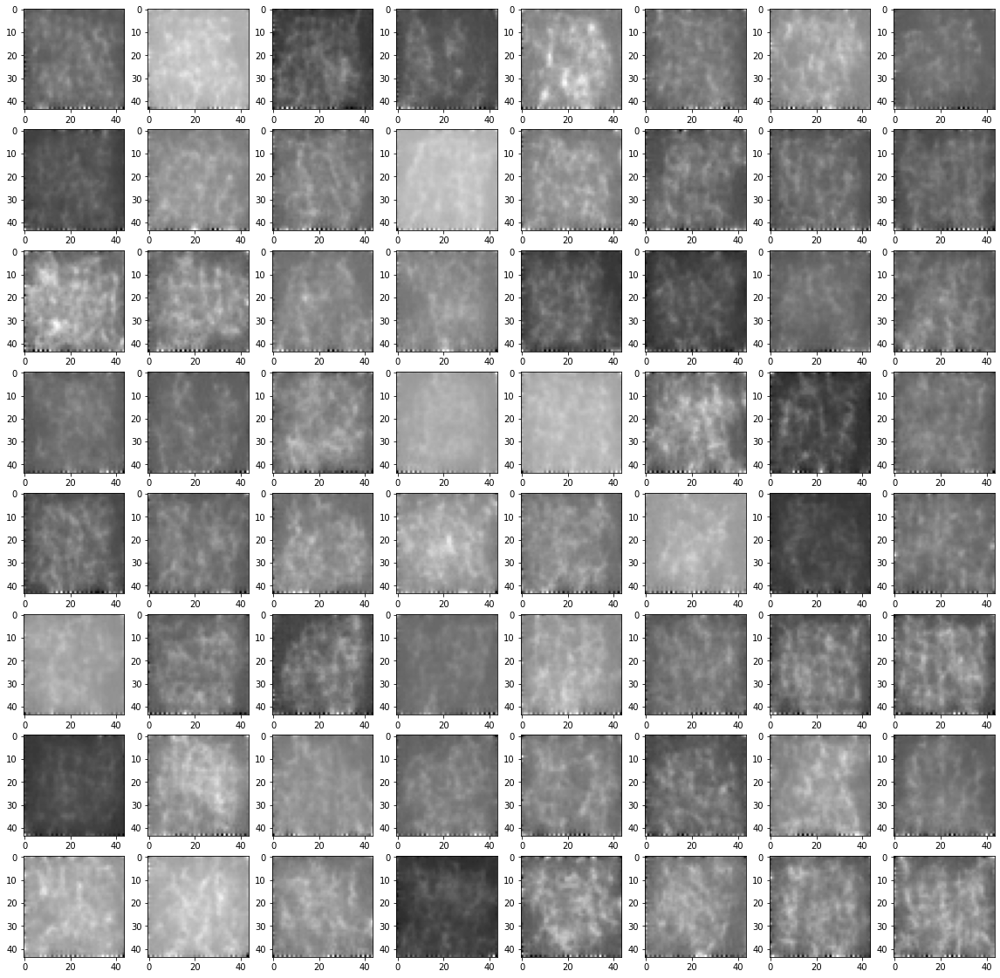

In [ ]:
fig, axs = plt.subplots(8,8,figsize = (20,20))
index = 0
for i in range(8):
  for j in range(8):
     # show a random one
    axs[i][j].imshow(samples[-1][index].reshape(image_size, image_size), cmap="gray")
    index += 1

In [ ]:
# sample 64 images
# we sample the model from the best models saved
model_best = Unet(
    dim=image_size,
    channels=channels,
    dim_mults=(1, 2, 4,)
).to(device)
model_best.load_state_dict(torch.load(f"{_exp_name}_best.ckpt"))

samples = sample(model_best, image_size=image_size, batch_size=64, channels=channels)

sampling loop time step:   0%|          | 0/300 [00:00<?, ?it/s]

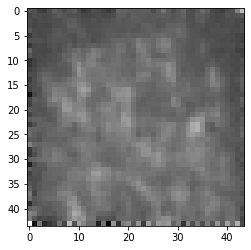

In [ ]:
# show a random one
random_index = 53
plt.imshow(samples[-1][random_index].reshape(image_size, image_size), cmap="gray")

In [ ]:
fig, axs = plt.subplots(8,8,figsize = (20,20))
index = 0
for i in range(8):
  for j in range(8):
     # show a random one
    axs[i][j].imshow(samples[-1][index].reshape(image_size, image_size), cmap="gray")
    index += 1

We can also create a gif of the denoising process:

In [ ]:
timesteps

200

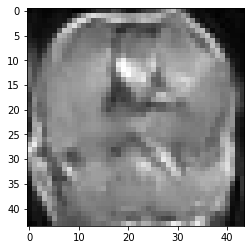

In [ ]:
import matplotlib.animation as animation

random_index = 54

fig = plt.figure()
ims = []
for i in range(timesteps):
    im = plt.imshow(samples[i][random_index].reshape(image_size, image_size), cmap="gray", animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=20, blit=True,
                                repeat_delay=1000)
ani.save('dynamic_images.mp4')
plt.show()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/dynamic_images.mp4"

# Compressed video path
compressed_path = "/content/dynamic_images.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Sampling (inference) 2

To sample from the model, we can just use our sample function defined above:


In [ ]:
# sample 64 images
# we sample the model from the best models saved 
model_best = Unet(
    dim=image_size,
    channels=channels,
    dim_mults=(1, 2, 4,)
).to(device)
model_best.load_state_dict(torch.load(f"{_exp_name}_best.ckpt"))

samples = sample(model_best, image_size=image_size, batch_size=64, channels=channels)

sampling loop time step:   0%|          | 0/300 [00:00<?, ?it/s]

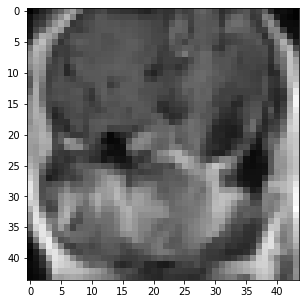

In [ ]:
# show a random one
random_index = 7
fig,ax = plt.subplots(figsize=(5,5))
ax.imshow(samples[-1][random_index].reshape(image_size, image_size), cmap="gray")

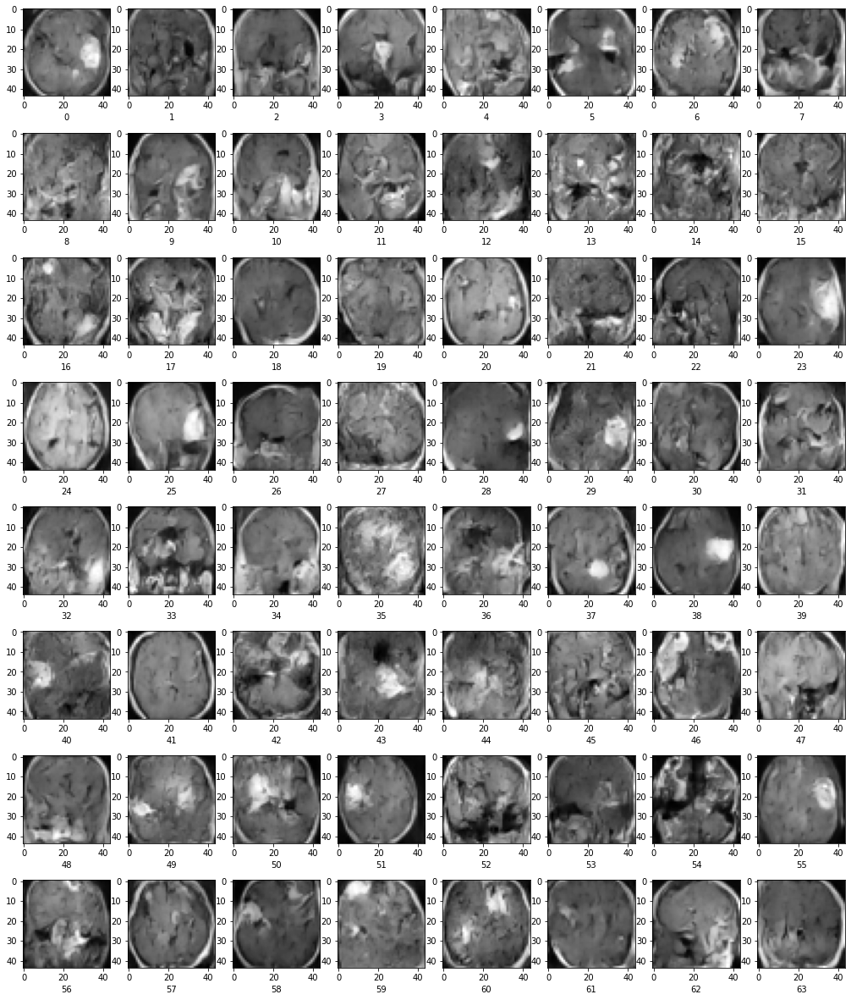

In [ ]:
fig, axs = plt.subplots(8,8,figsize = (20,20))
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
index = 0
for i in range(8):
  for j in range(8):
     # show a random one
    axs[i][j].imshow(samples[-1][index].reshape(image_size, image_size), cmap="gray")
    axs[i][j].set_xlabel(str(index))
    index += 1

In [ ]:
timesteps

200

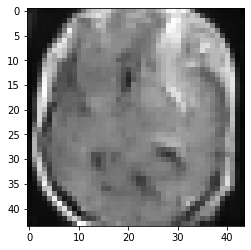

In [ ]:
import matplotlib.animation as animation

random_index = 34

fig = plt.figure()
ims = []
for i in range(timesteps):
    im = plt.imshow(samples[i][random_index].reshape(image_size, image_size), cmap="gray", animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=20, blit=True,
                                repeat_delay=1000)
ani.save('dynamic_images.mp4')
plt.show()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/dynamic_images.mp4"

# Compressed video path
compressed_path = "/content/dynamic_images.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## References

1. H. Huang, P. S. Yu, και C. Wang, ‘An Introduction to Image Synthesis with Generative Adversarial Nets’. arXiv, 2018.
2. A. Ramesh κ.ά., ‘Zero-Shot Text-to-Image Generation’. arXiv, 2021.
3. J. Yu κ.ά., ‘Vector-quantized Image Modeling with Improved VQGAN’. arXiv, 2021.
4. M. Özbey κ.ά., ‘Unsupervised Medical Image Translation with Adversarial Diffusion Models’. arXiv, 2022.
5. J. Ho, A. Jain, and P. Abbeel, ‘Denoising Diffusion Probabilistic Models’. arXiv, 2020.
6. S. U. Dar, M. Yurt, L. Karacan, A. Erdem, E. Erdem, and T. C¸ ukur, “Image synthesis in multi-contrast MRI with conditional generative adversarial networks,” IEEE Trans. Med. Imag., vol. 38, no. 10, pp. 2375–2388, 2019.
7. B. Yu, L. Zhou, L. Wang, Y. Shi, J. Fripp, and P. Bourgeat, “Ea-GANs:Edge-aware generative adversarial networks for cross-modality MR imagesynthesis,” IEEE Trans. Med. Imag., vol. 38, no. 7, pp. 1750–1762, 2019.
8. A. Sharma and G. Hamarneh, “Missing MRI pulse sequence synthesis using multi-modal generative adversarial network,” IEEE Trans. Med. Imag., vol. 39, pp. 1170–1183, 2020.
9. G. Wang et al., “Synthesize high-quality multi-contrast magnetic resonance imaging from multi-echo acquisition using multi-task deep generative model,” IEEE Trans. Med. Imag., vol. 39, no. 10, pp. 3089–3099, 2020.
10. Github repo, Denoising Diffusion Probabilistic Model, in Pytorch. https://github.com/lucidrains/denoising-diffusion-pytorch